In [1]:
import pandas as pd
from datetime import datetime, date
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import os
import pandas as pd
import openpyxl as excel
import glob
import cgmquantify as cgm

# Data Preparation and Loading ...

In [2]:
path = r'' # Specify path

extension = 'csv'

os.chdir(path)

files = [i for i in glob.glob('*.{}'.format(extension))]

files

patient_unstrip_IDs = [i.split('_entries', 1)[0] for i in files]

patient_IDs = [ele.lstrip('0') for ele in patient_unstrip_IDs]

#f = files[0]
#print(f)

print(patient_IDs)

df_id_files = pd.DataFrame({'id': patient_IDs, 'EntriesFileName': files})

print(df_id_files)

['221634', '309157', '897741', '2033176', '2199852', '4762925', '5274556', '7886752', '12689381', '13029224', '13484299', '14092221', '15558575', '15634563', '16975609', '17161370', '18991425', '19626656', '20216809', '20396154', '20649783', '21946407', '23428091', '24448124', '25692073', '26856617', '27526291', '27819368', '28176124', '28608066', '28756888', '28768536', '32407882', '32997134', '33470634', '33831564', '33962890', '35533061', '35719805', '37764532', '37948668', '37998755', '38110191', '39986716', '40634871', '40997757', '41131654', '42052178', '43589707', '45120081', '46253612', '47323535', '47750728', '48509634', '48540630', '49551394', '49796612', '50311906', '51968000', '54280576', '56568290', '56958831', '57176789', '60844515', '61179686', '62345070', '63047517', '63047517', '63725802', '64024750', '64406000', '65143138', '66019205', '66773091', '66836068', '66937570', '67167655', '67208817', '68026248', '69587086', '69739062', '69965708', '70454270', '70811987', '7

In [ ]:
demographics_path = r'' # Specify path

df_demographics = pd.read_csv(demographics_path, index_col=None)

df_demographics.head(2)

# Statistical and Variability Metrics for Glucose Analysis from CGM Data

count - total CGM data points

mean - average of CGM data

std	- standard deviation of CGM data

min	- minimum CGM data value

25%	- Q1

50%	- Q2

75%	- Q3 

max - maximum CGM data value

interdaysd - computes interday standard deviation

interdaycv - computes interday coefficient of variation

TORless70 - computes time outside range --> (hypoglycemia | BG < 70 mg/dL) in percentage

TIR - computes time inside range --> (target range | 70 mg/dl < BG < 180 mg/dL) in percentage

TORmore180 - computes time outside range --> (hyperglycemia | BG > 180 mg/dL) in percentage

POR - computes percent of time outside range (range in standard deviations from mean, default = 1). sr is the sampling rate inverse in minutes of the CGM 

J_index - computes the glycemic variability metric, J-index

LBGI - computes glycemic variability metric low blood glucose index

HBGI - computes glycemic variability metric high blood glucose index

GMI - computes glycemic management indicator

# Extract demographics for all patients, plot CGM data from entries files, calculate metrics, and exploratory data analysis

Patient ID:  221634


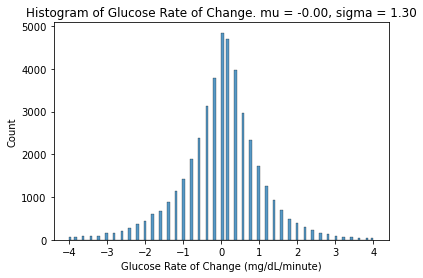

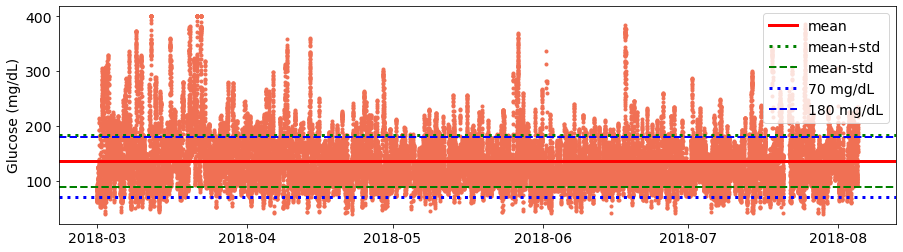

Patient ID:  309157


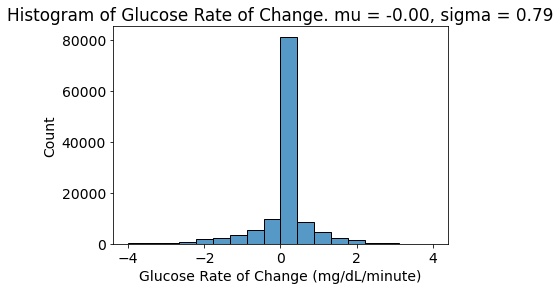

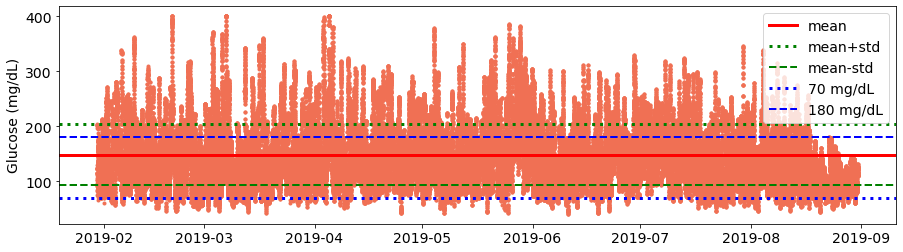

Patient ID:  897741


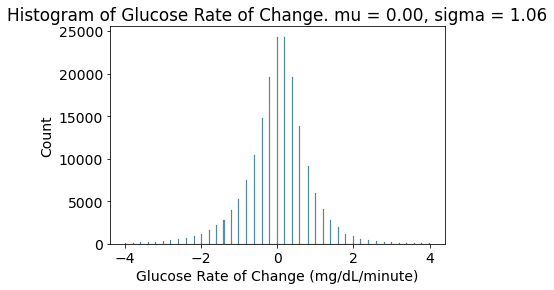

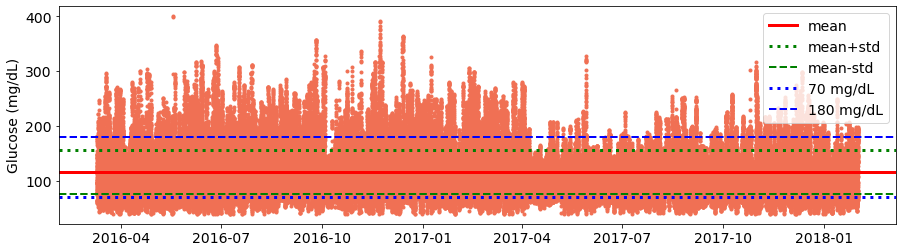

Patient ID:  2033176


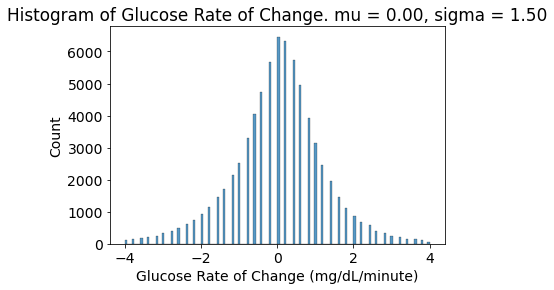

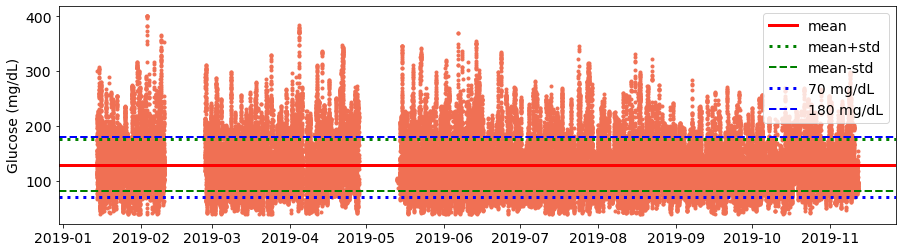

Patient ID:  2199852


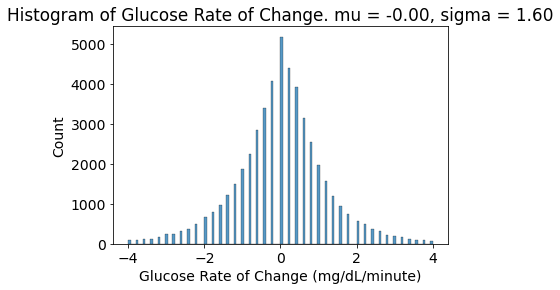

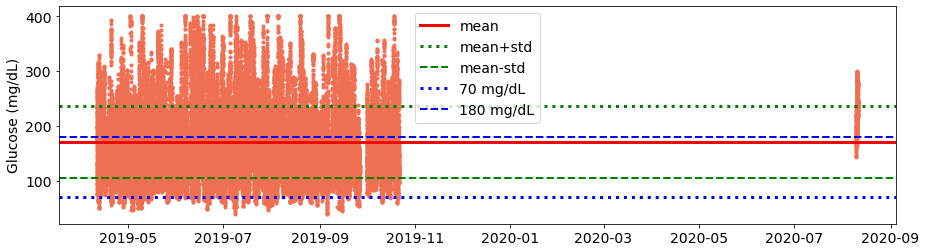

Patient ID:  4762925


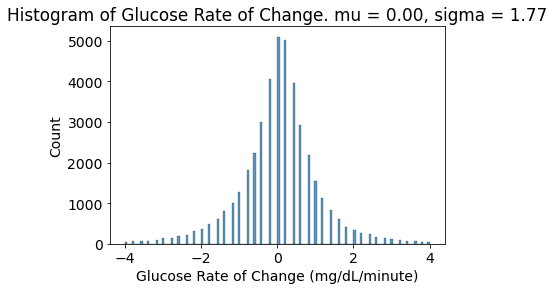

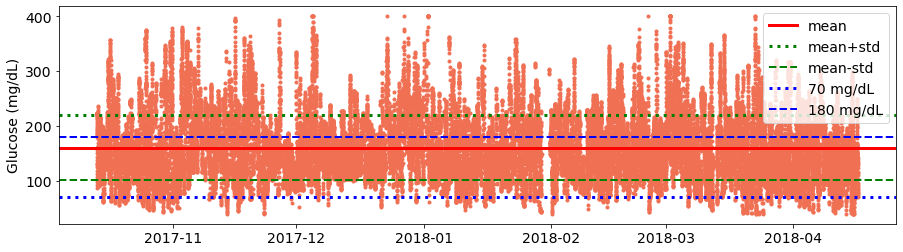

Patient ID:  7886752


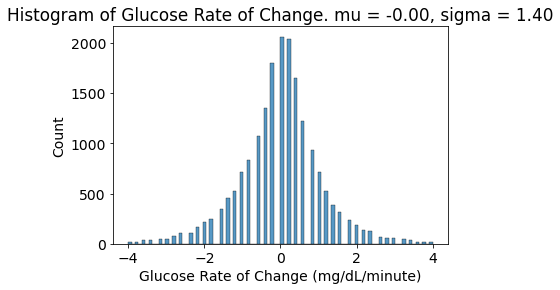

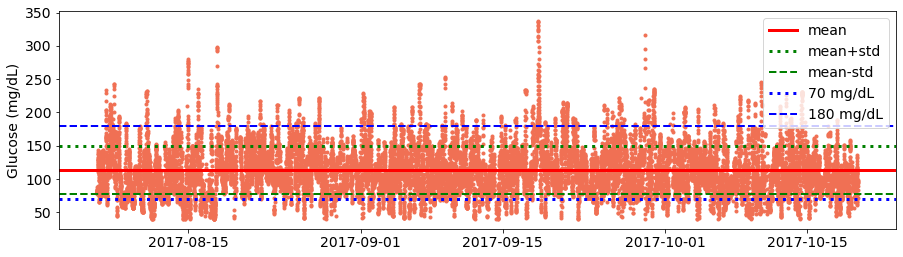

Patient ID:  12689381


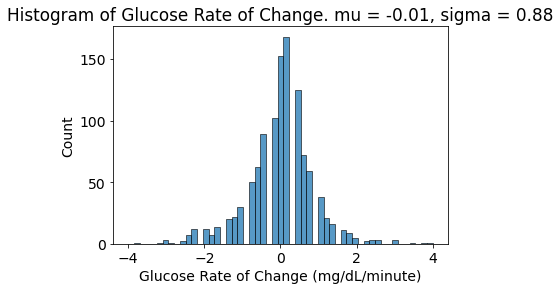

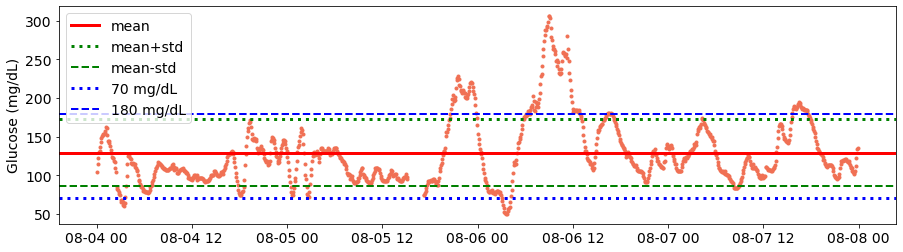

Patient ID:  13029224


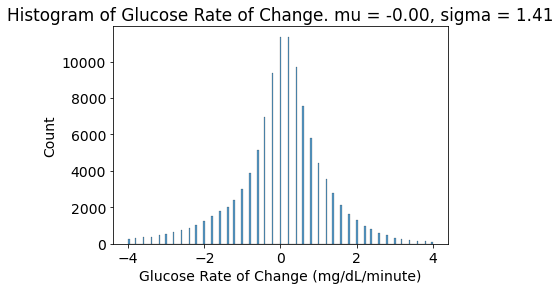

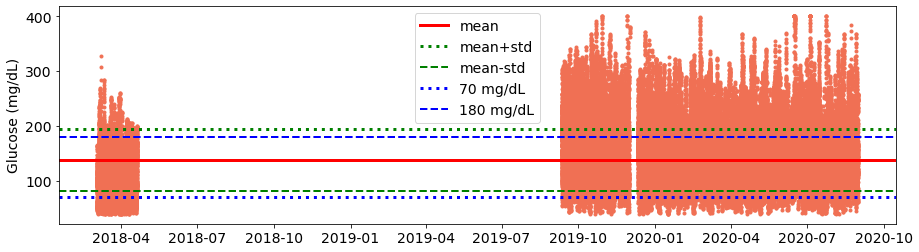

Patient ID:  13484299


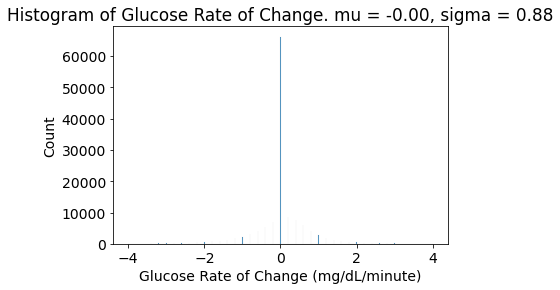

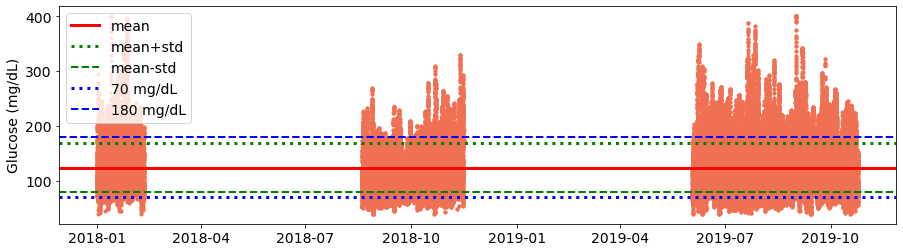

Patient ID:  14092221


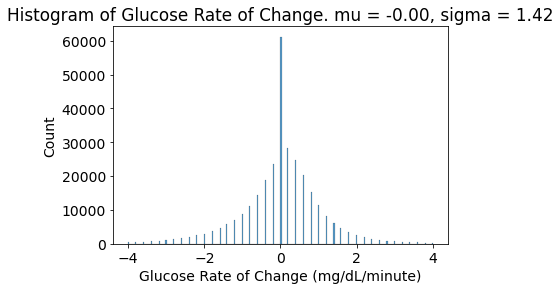

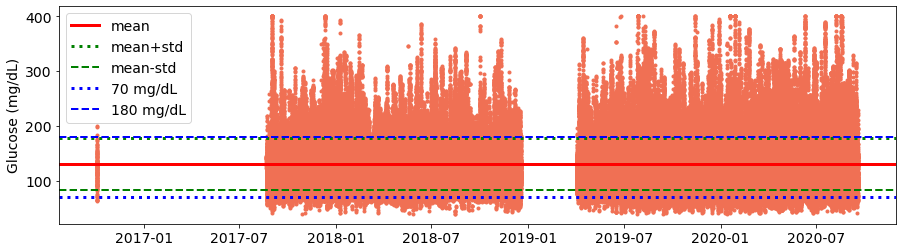

Patient ID:  15558575


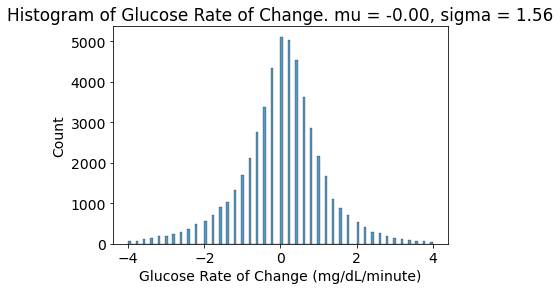

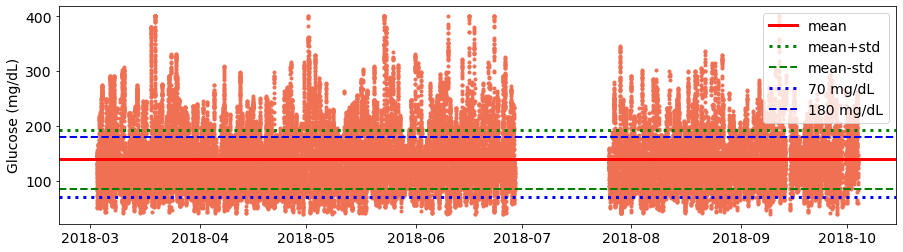

Patient ID:  15634563


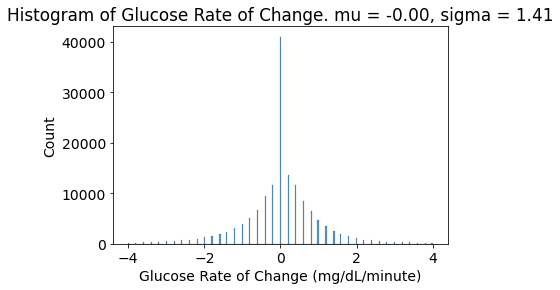

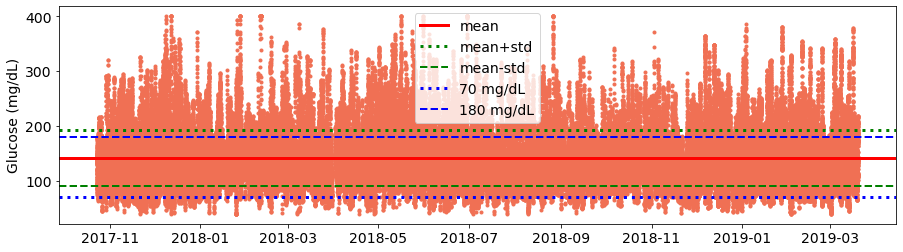

Patient ID:  16975609


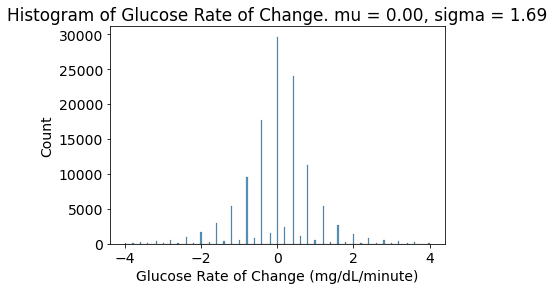

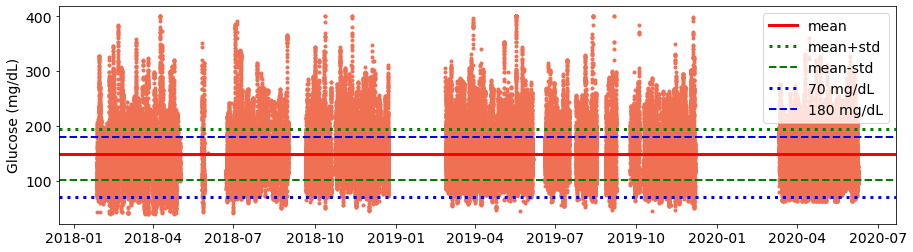

Patient ID:  17161370


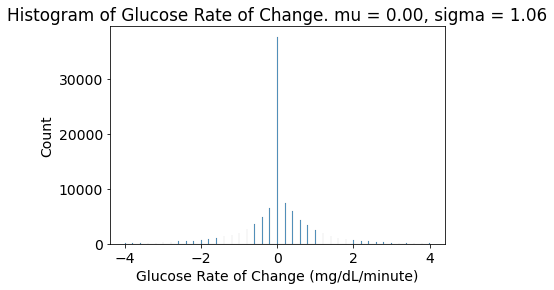

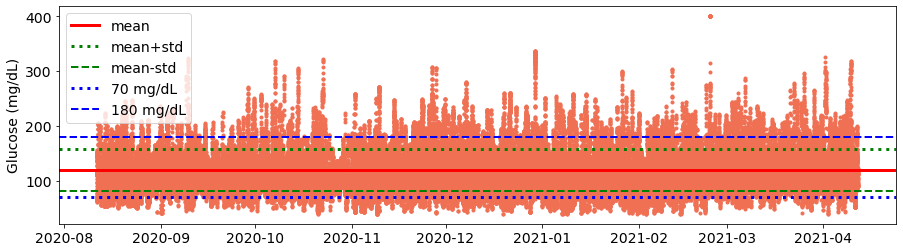

Patient ID:  18991425


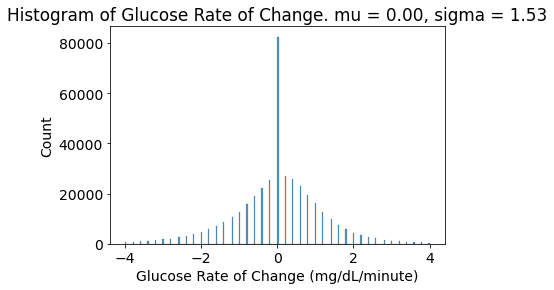

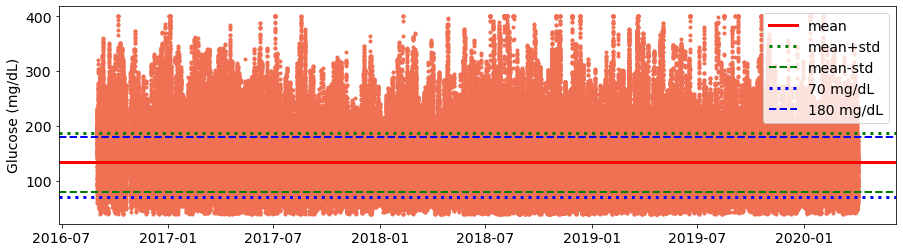

Patient ID:  19626656


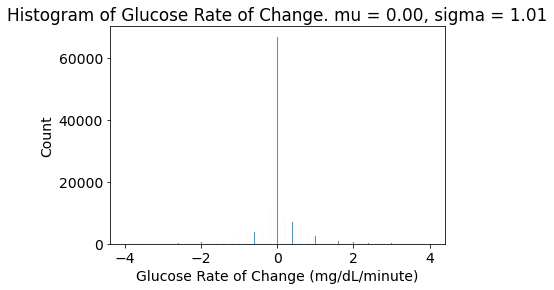

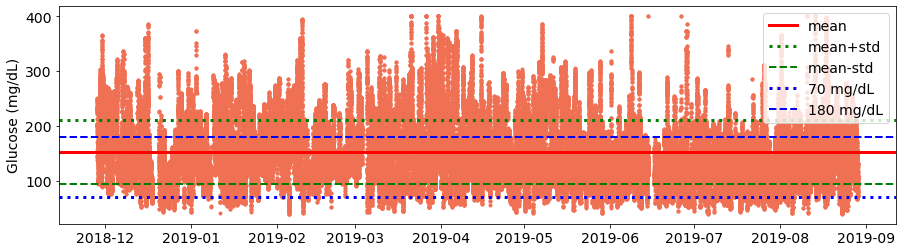

Patient ID:  20216809


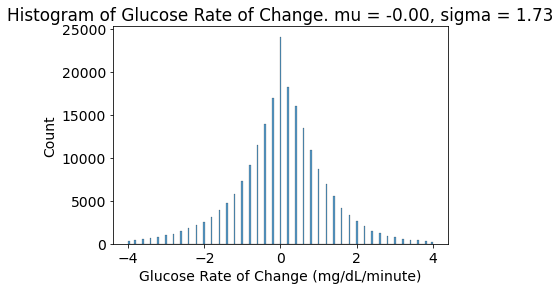

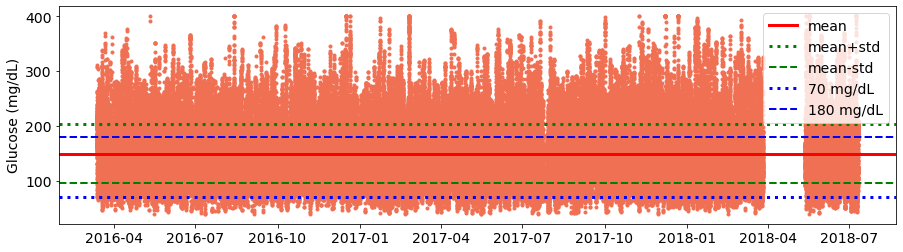

Patient ID:  20396154


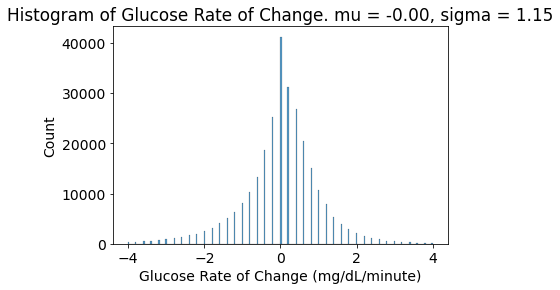

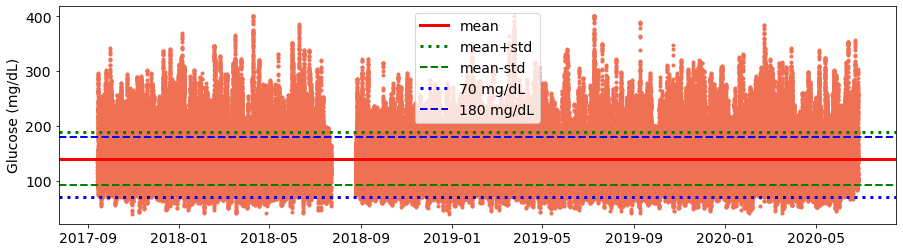

Patient ID:  20649783


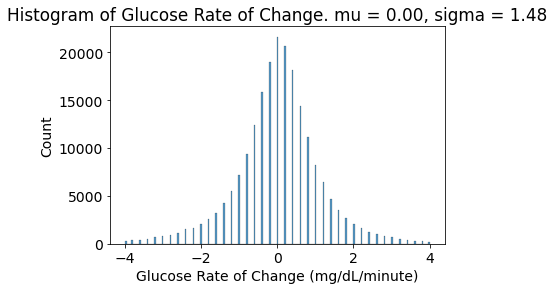

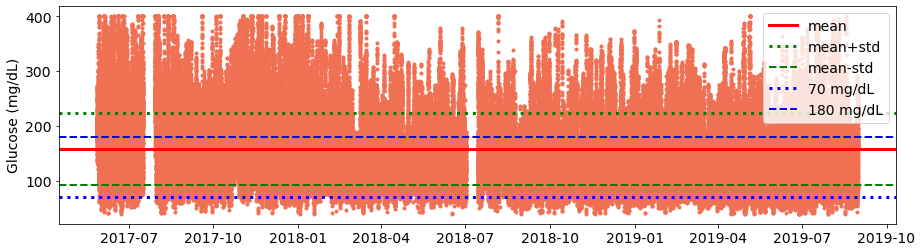

Patient ID:  21946407


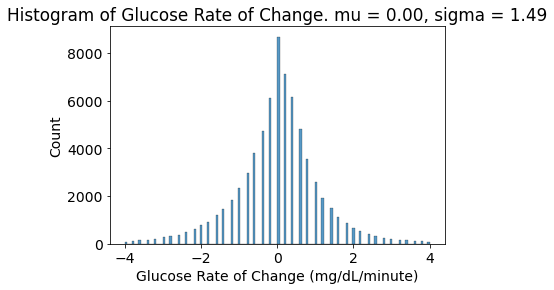

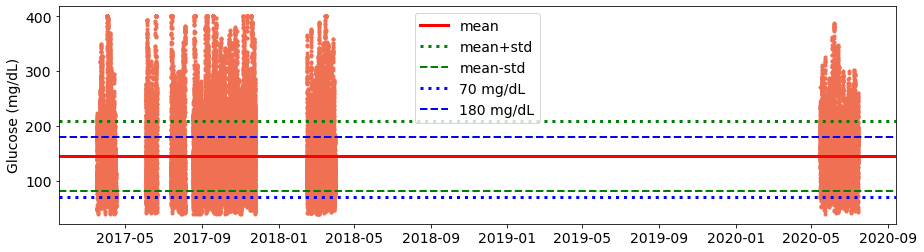

Patient ID:  23428091


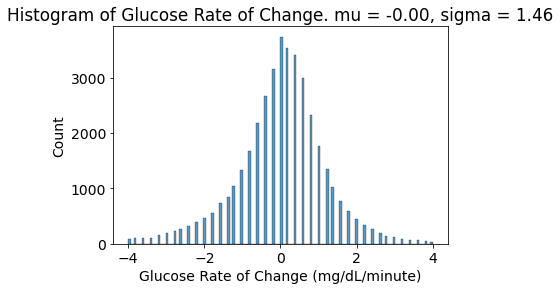

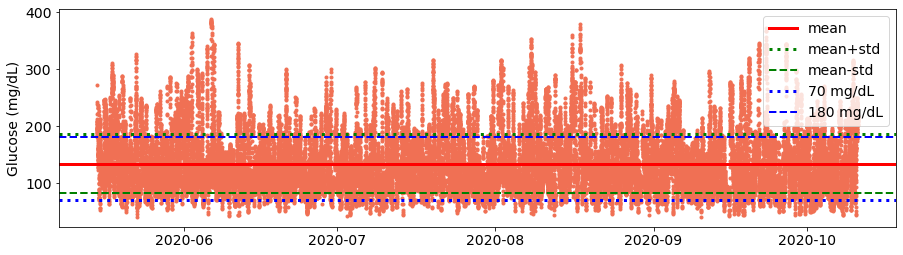

Patient ID:  24448124


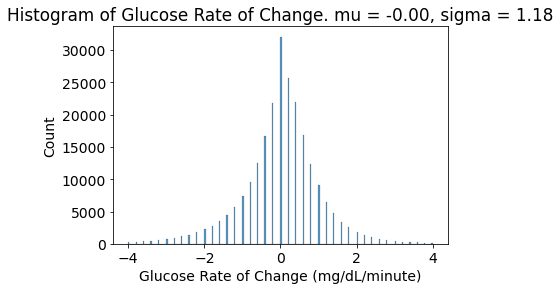

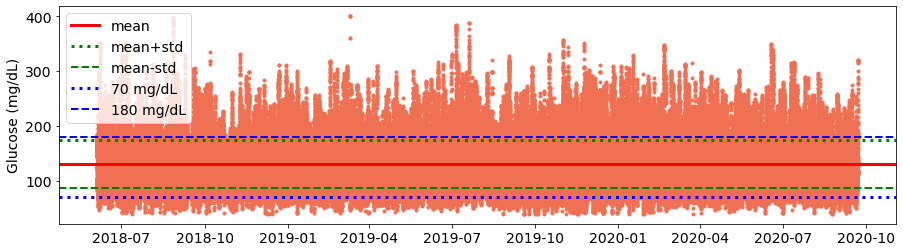

Patient ID:  25692073


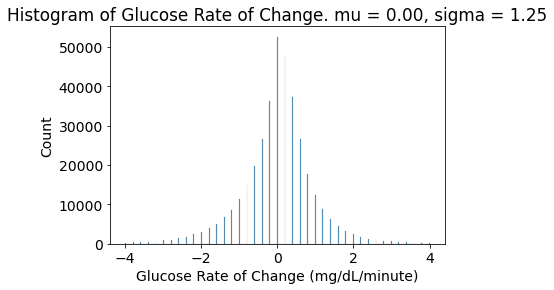

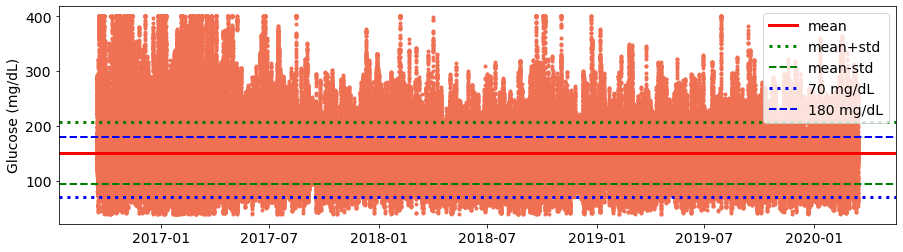

Patient ID:  26856617


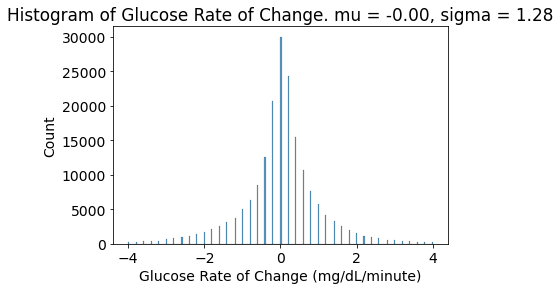

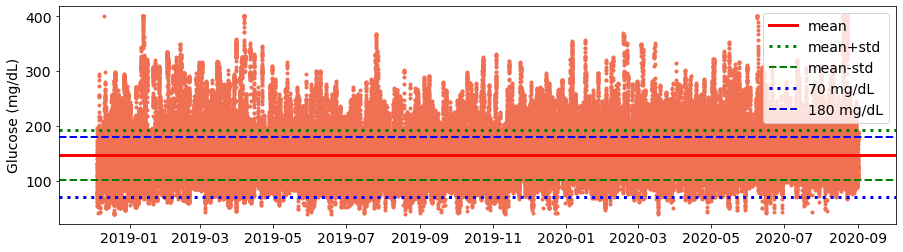

Patient ID:  27526291


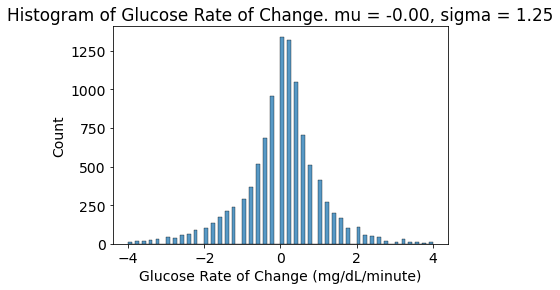

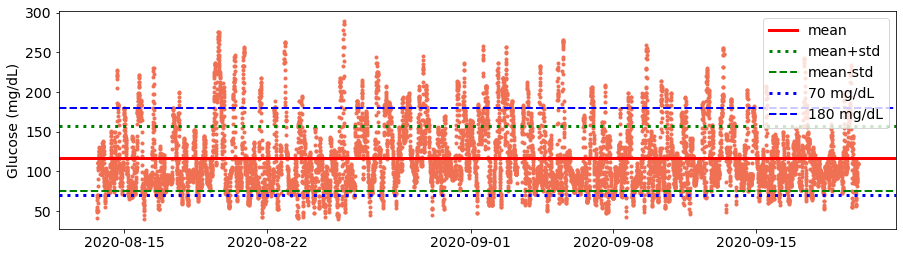

Patient ID:  27819368


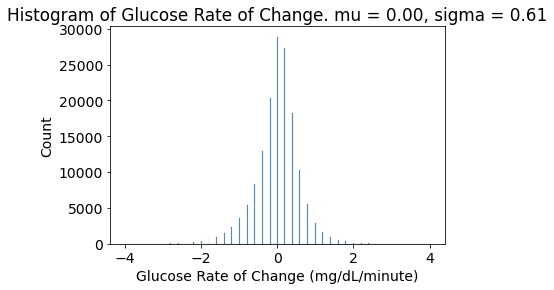

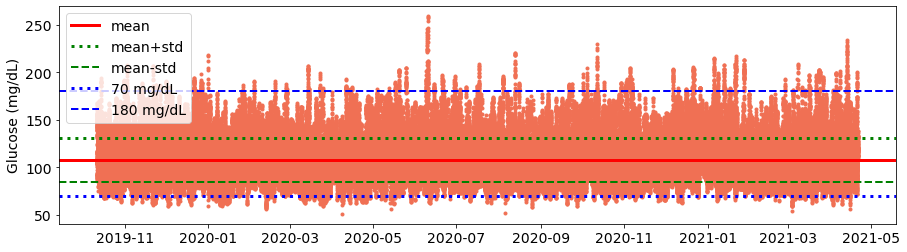

Patient ID:  28176124


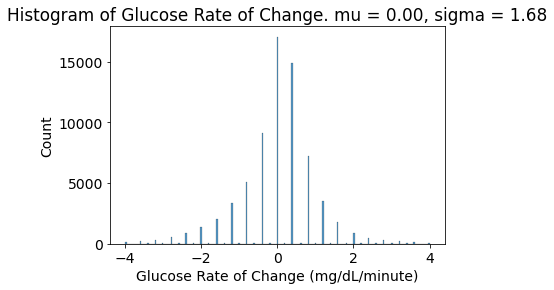

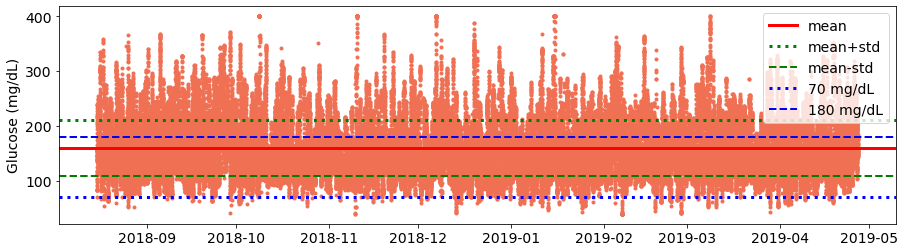

Patient ID:  28608066


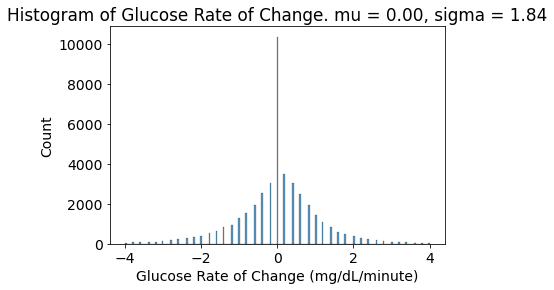

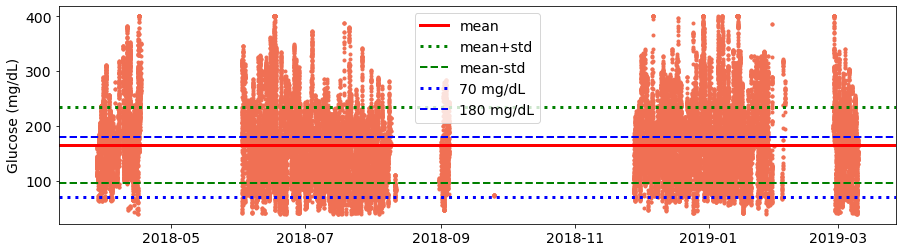

Patient ID:  28756888


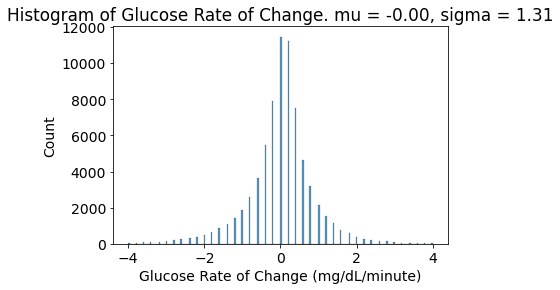

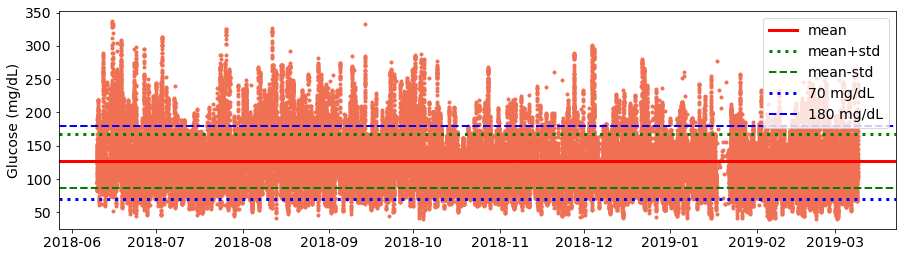

Patient ID:  28768536


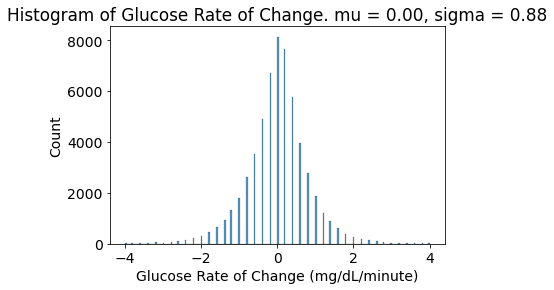

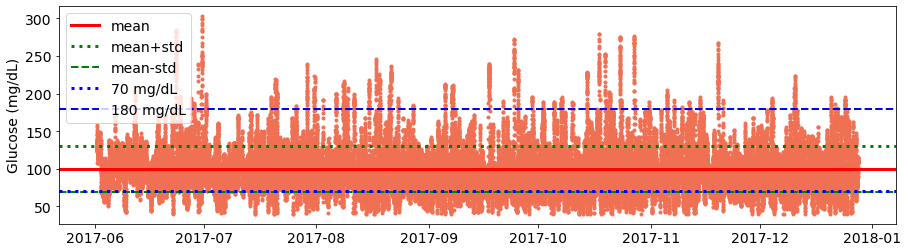

Patient ID:  32407882


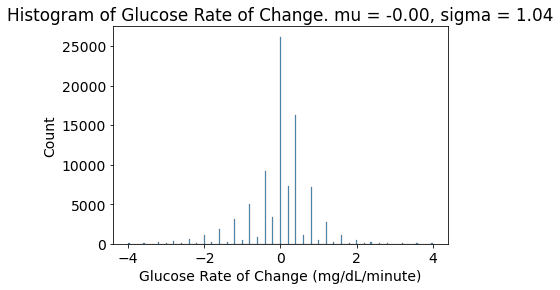

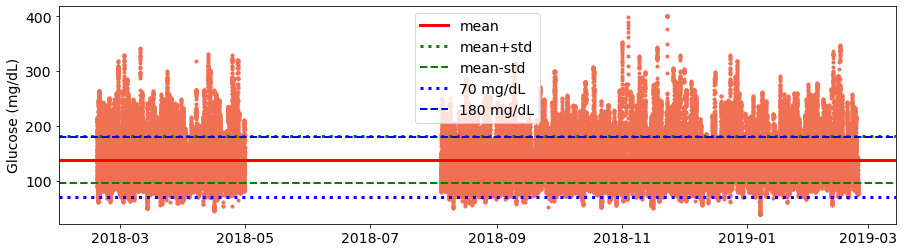

Patient ID:  32997134


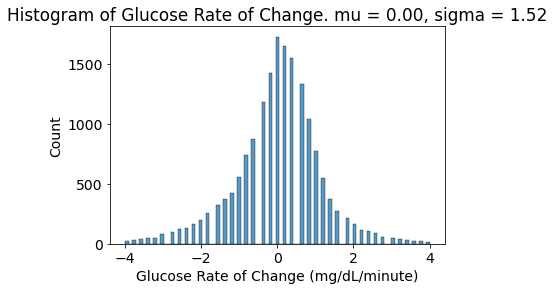

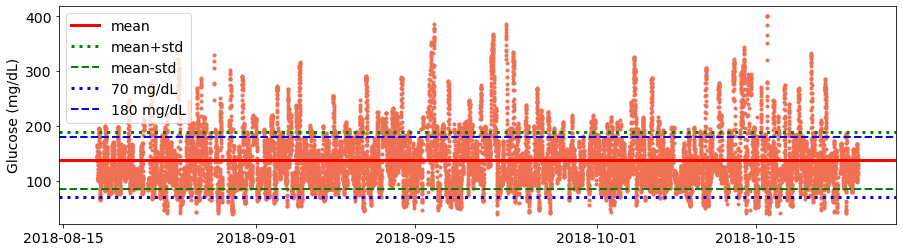

Patient ID:  33962890


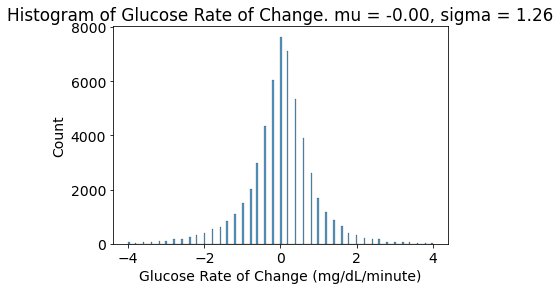

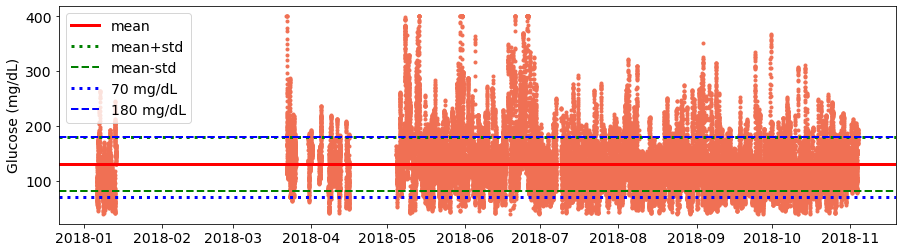

Patient ID:  35533061


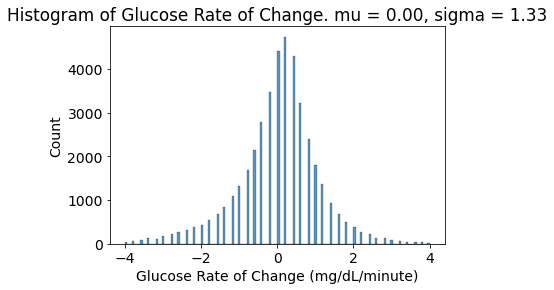

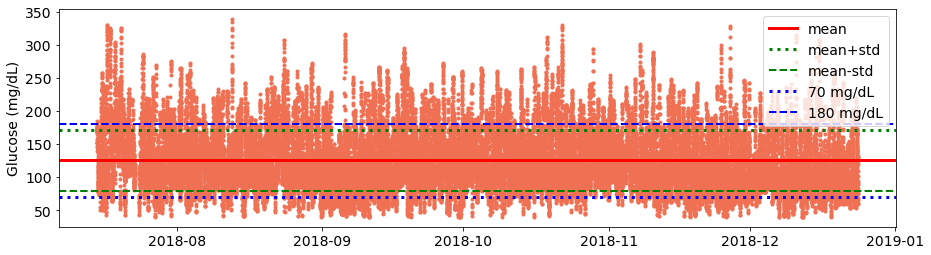

Patient ID:  35719805


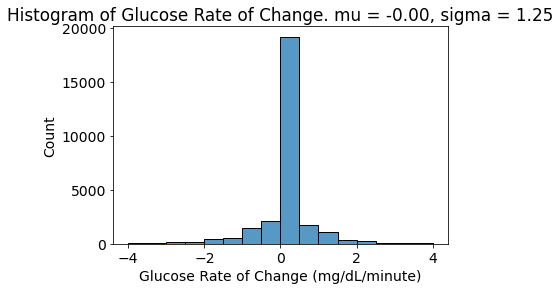

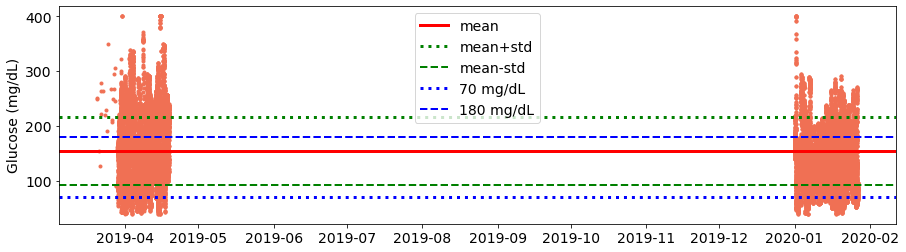

Patient ID:  37764532


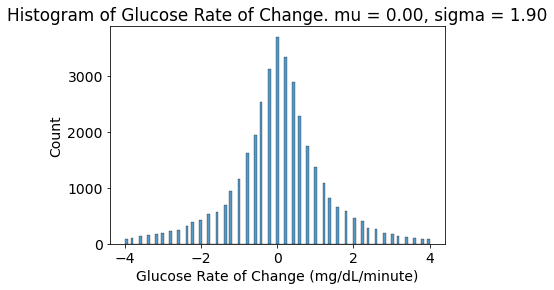

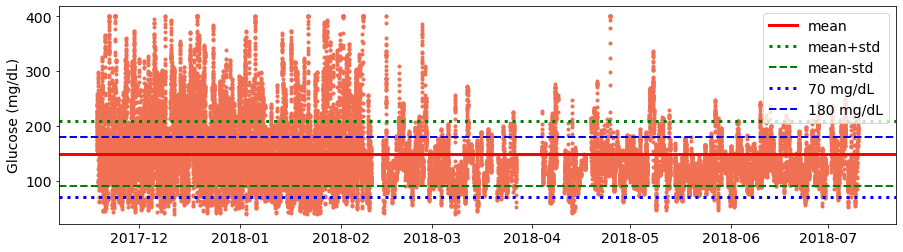

Patient ID:  37948668


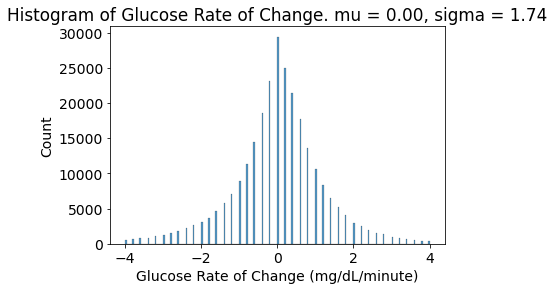

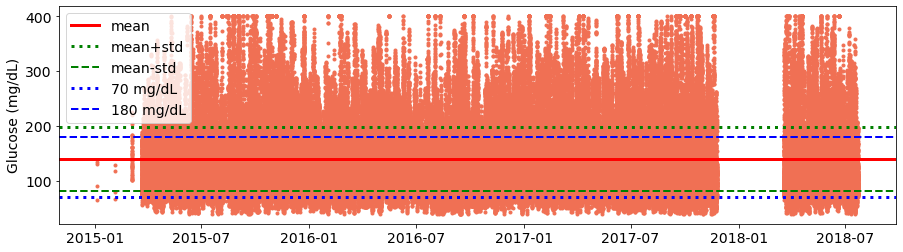

Patient ID:  37998755


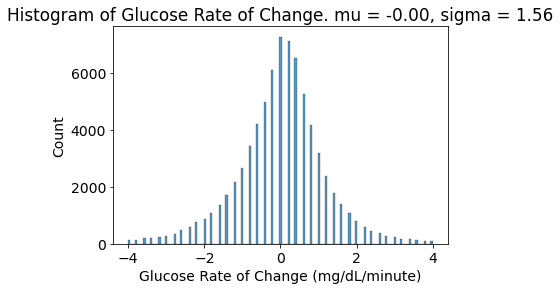

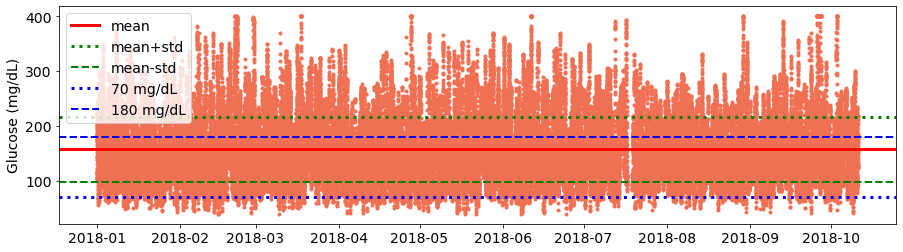

Patient ID:  39986716


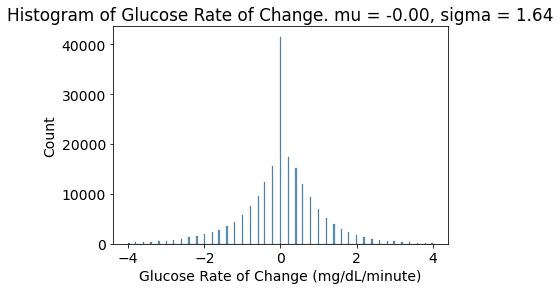

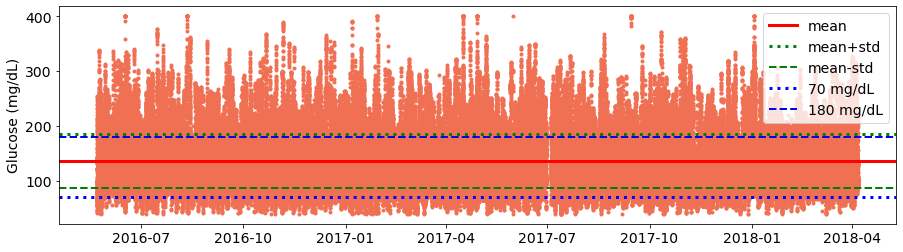

Patient ID:  40634871


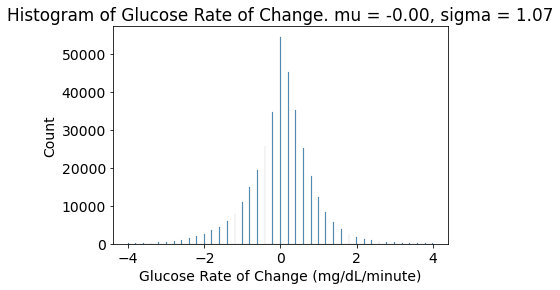

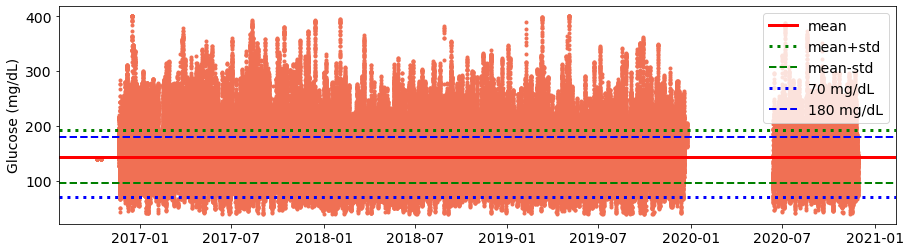

Patient ID:  40997757


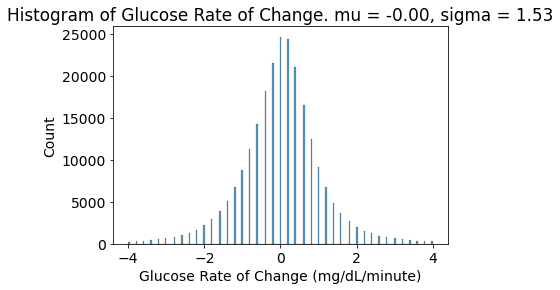

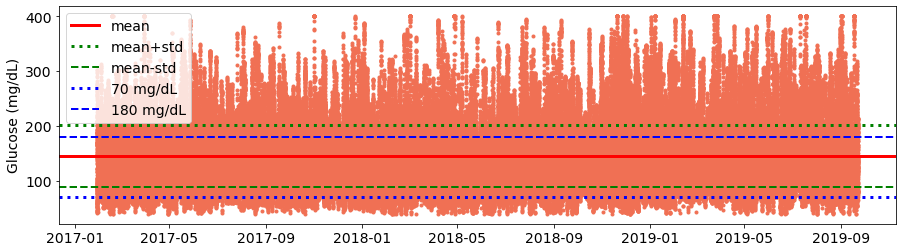

Patient ID:  41131654


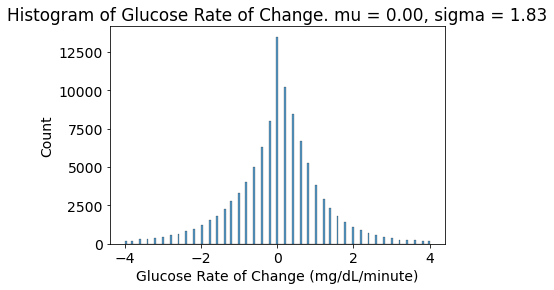

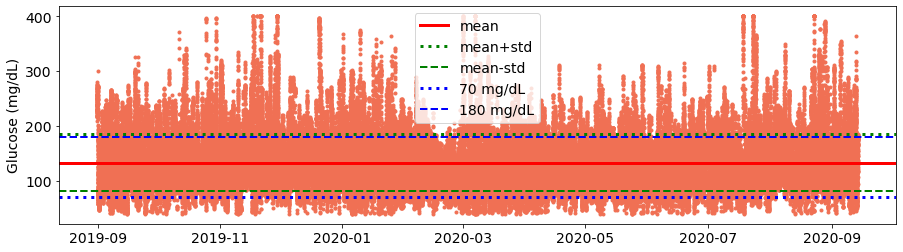

Patient ID:  42052178


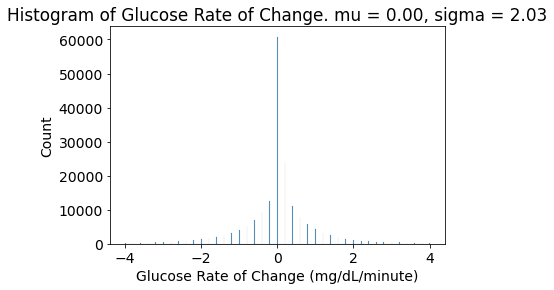

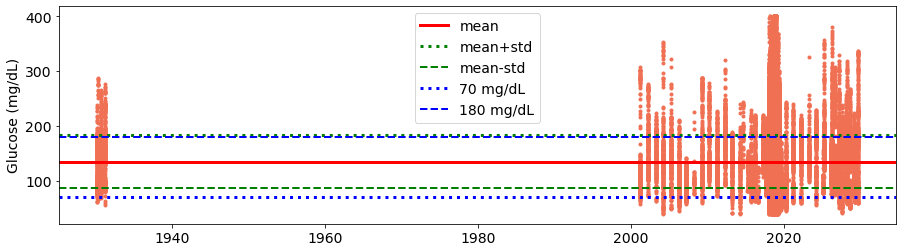

Patient ID:  43589707


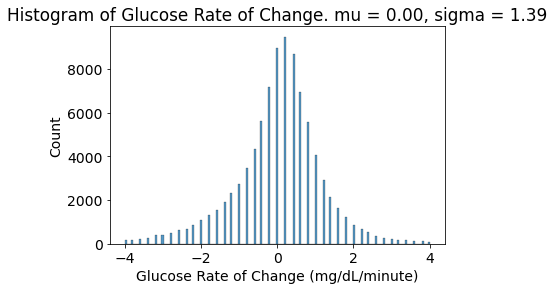

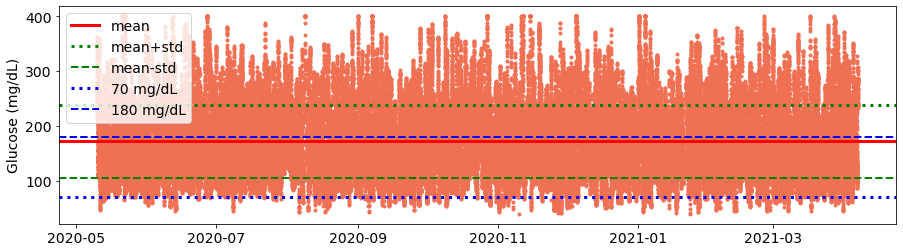

Patient ID:  45120081


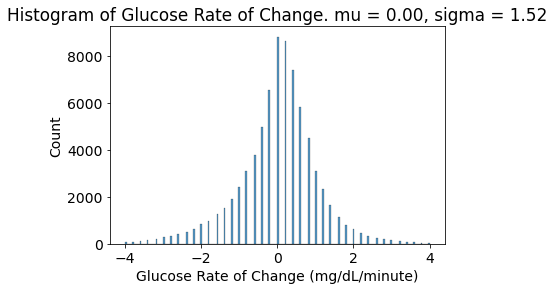

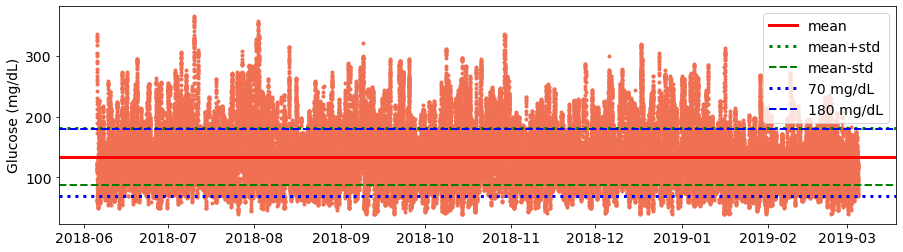

Patient ID:  47323535


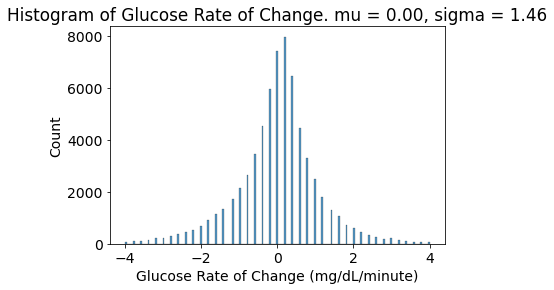

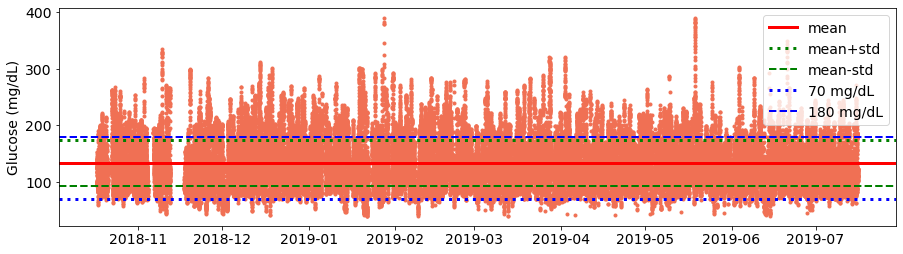

Patient ID:  47750728


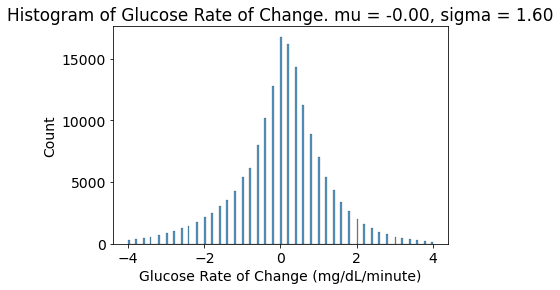

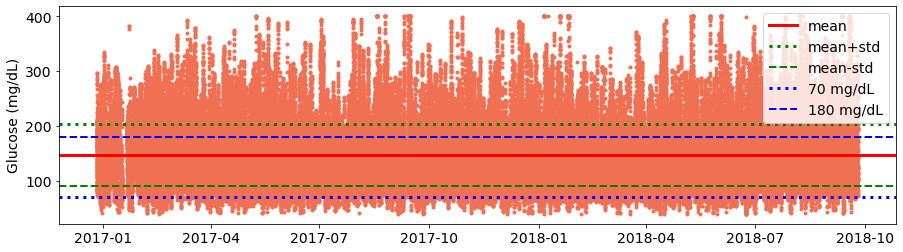

Patient ID:  48509634


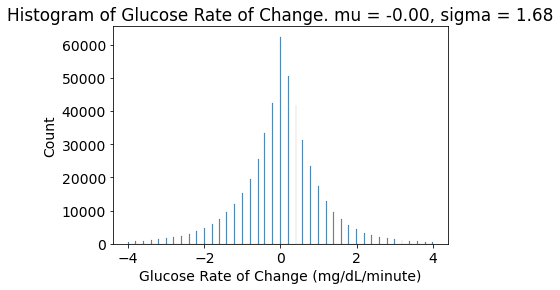

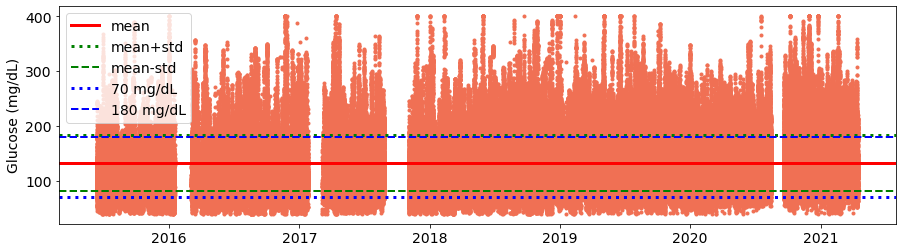

Patient ID:  49551394


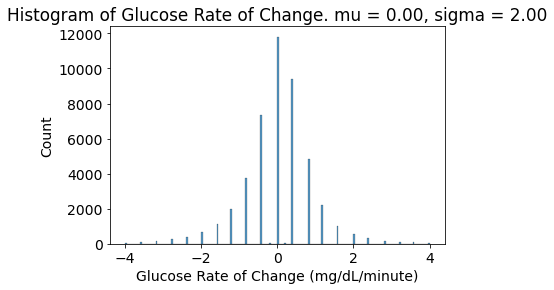

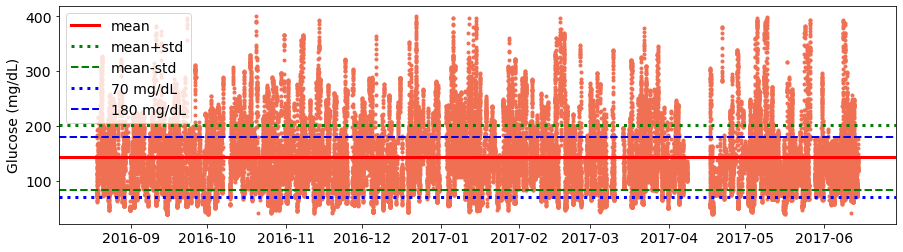

Patient ID:  49796612


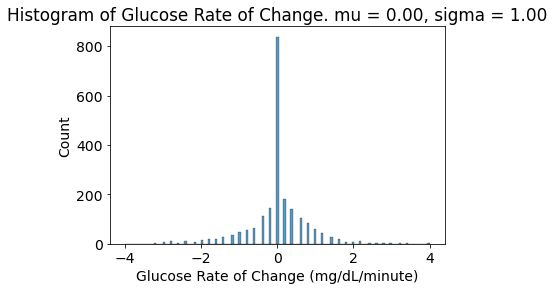

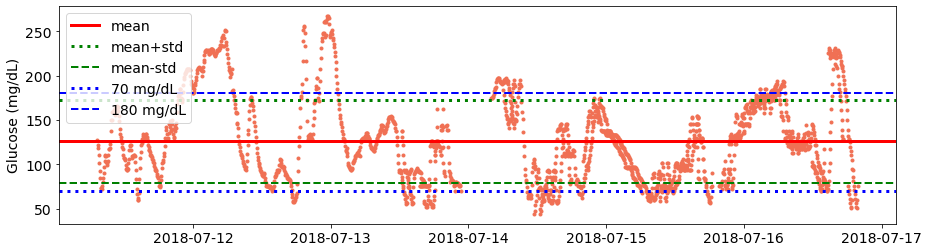

Patient ID:  50311906


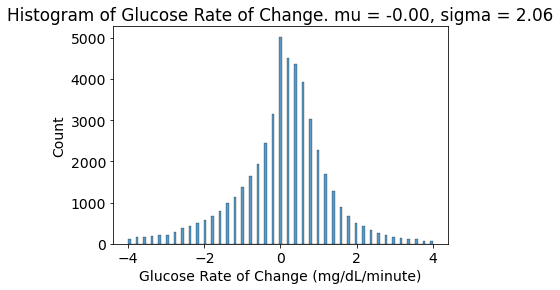

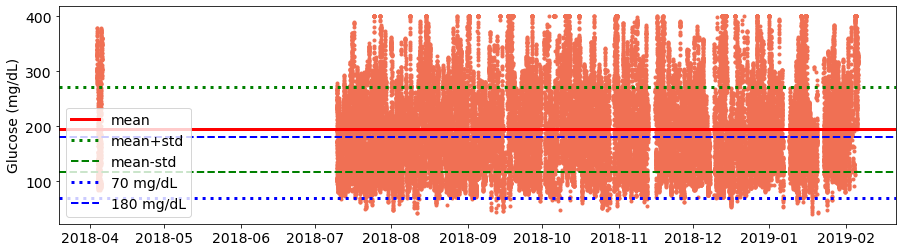

Patient ID:  54280576


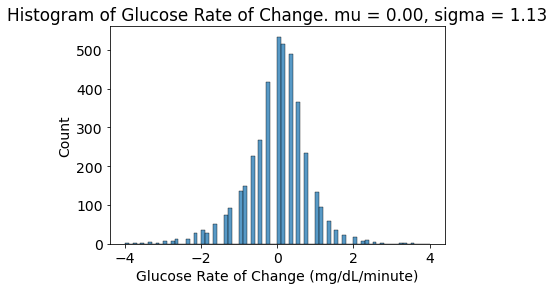

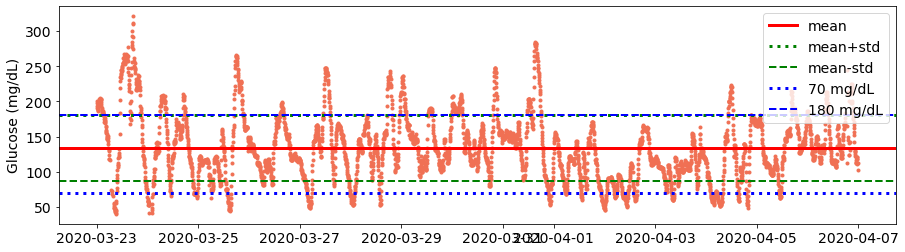

Patient ID:  56568290


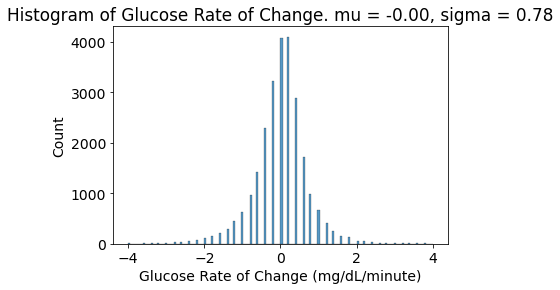

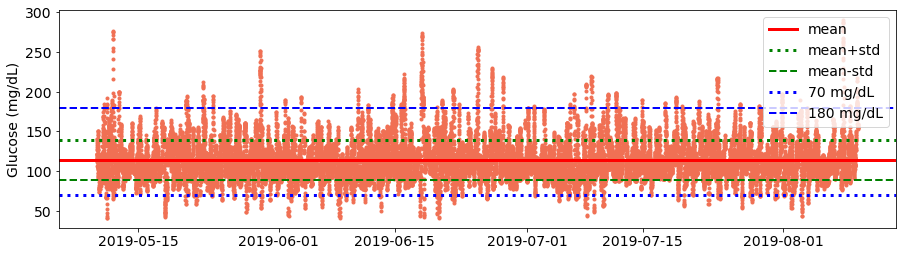

Patient ID:  56958831


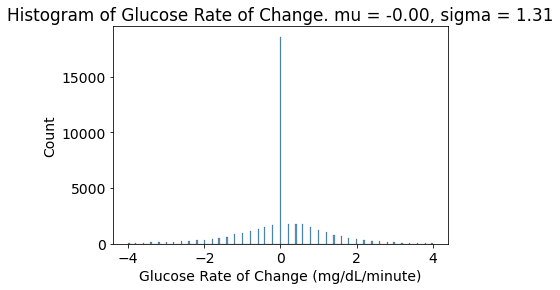

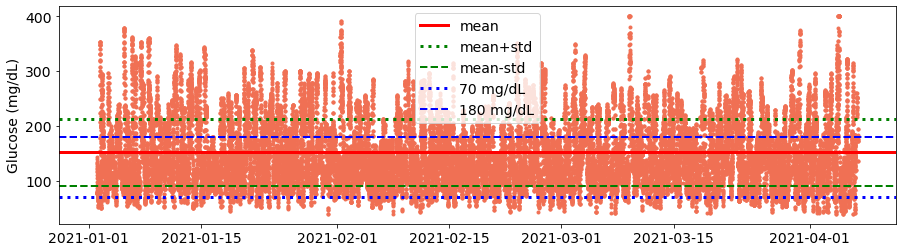

Patient ID:  60844515


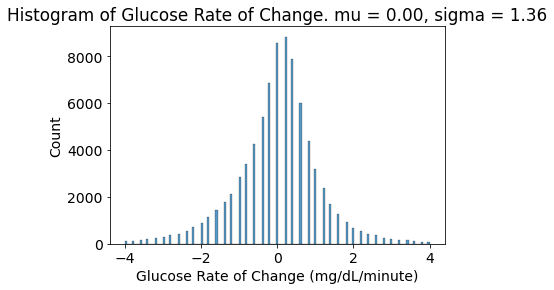

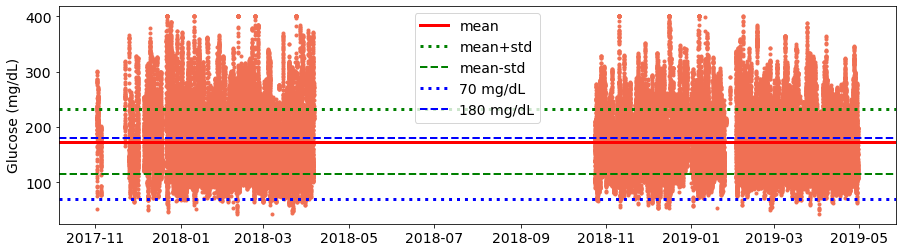

Patient ID:  61179686


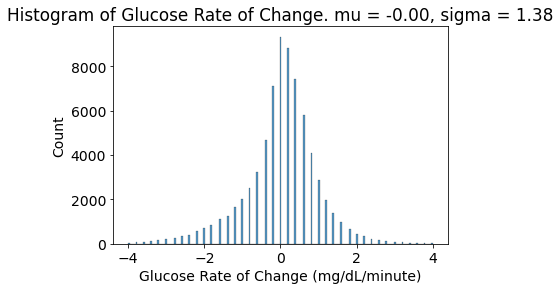

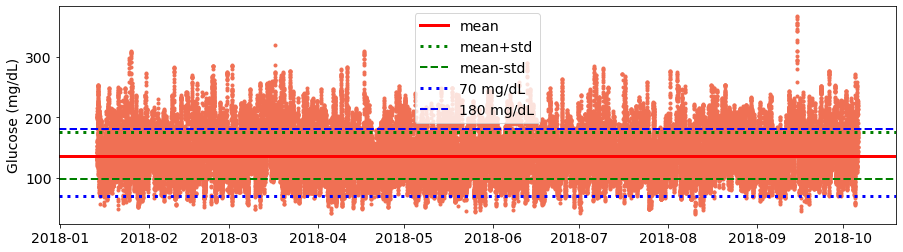

Patient ID:  63047517


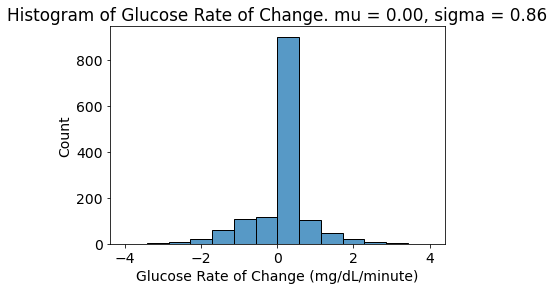

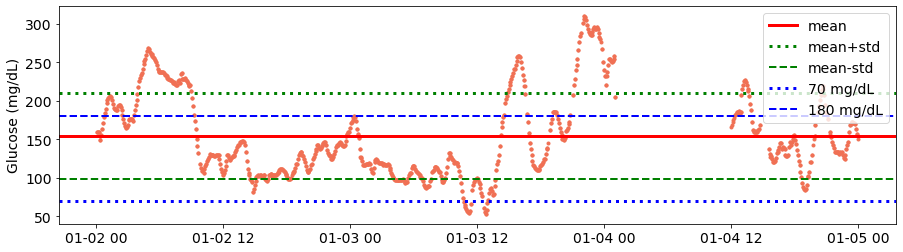

Patient ID:  63047517


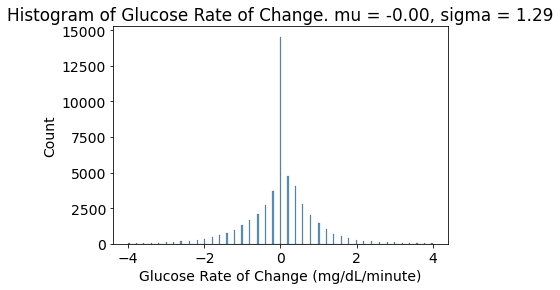

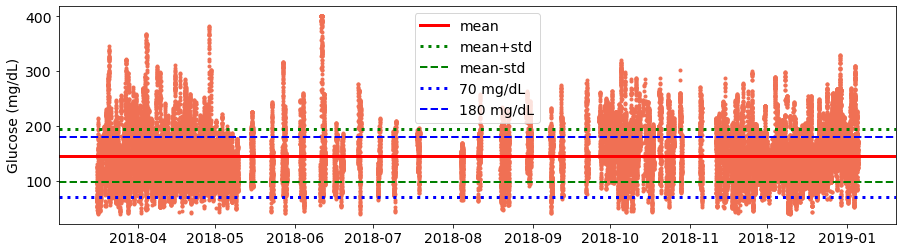

Patient ID:  63725802


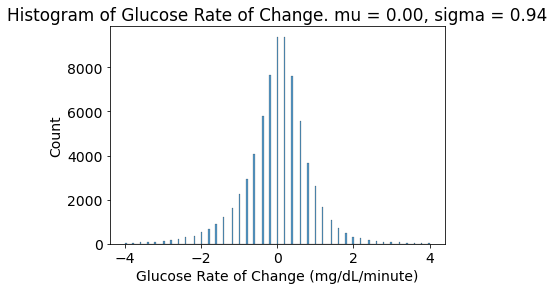

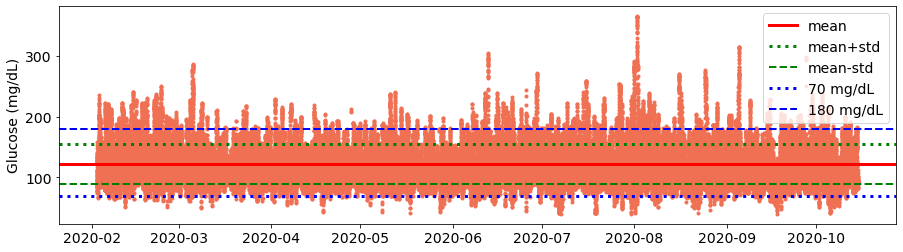

Patient ID:  64024750


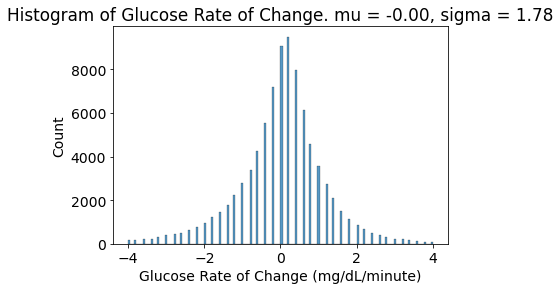

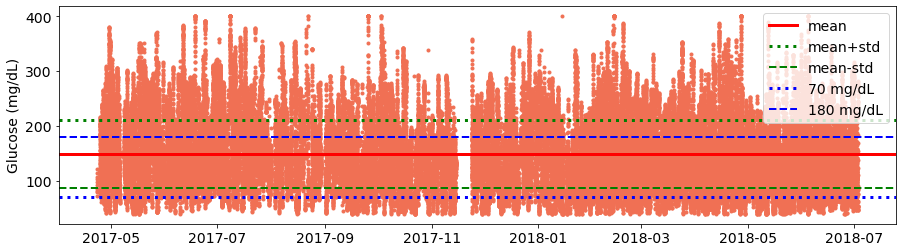

Patient ID:  64406000


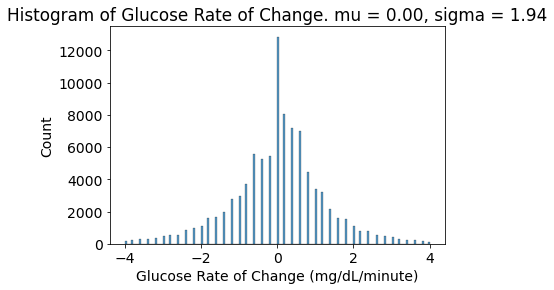

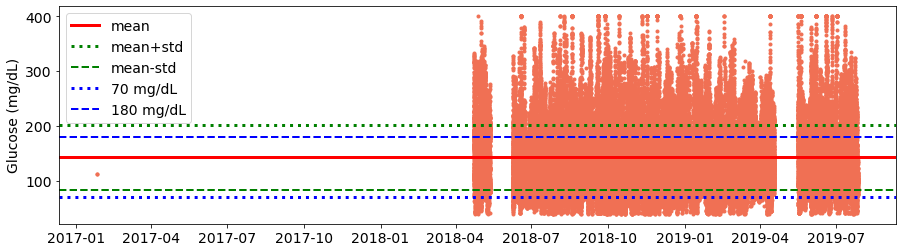

Patient ID:  65143138


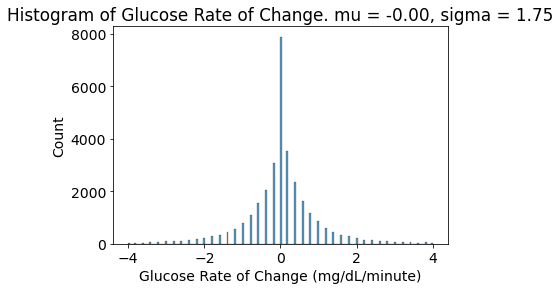

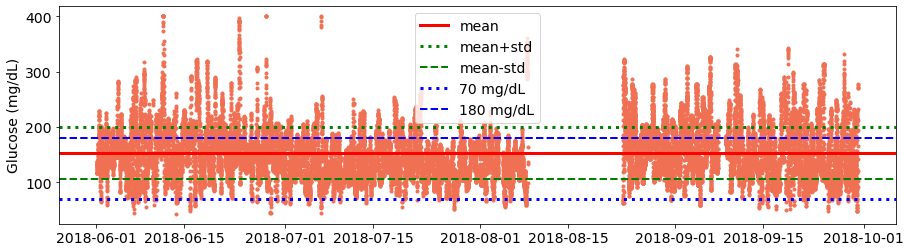

Patient ID:  66019205


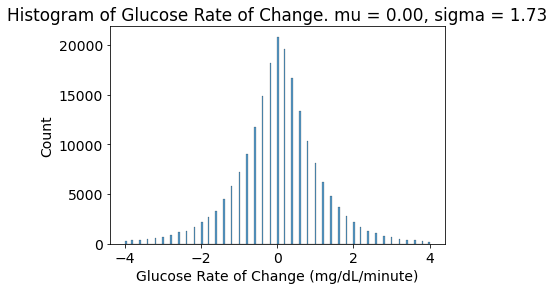

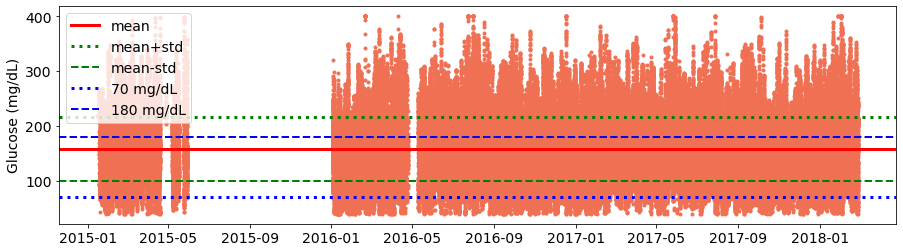

Patient ID:  66773091


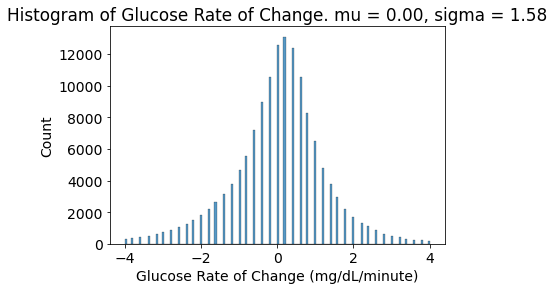

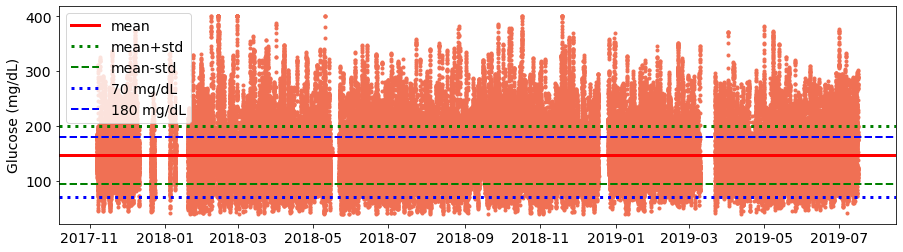

Patient ID:  66836068


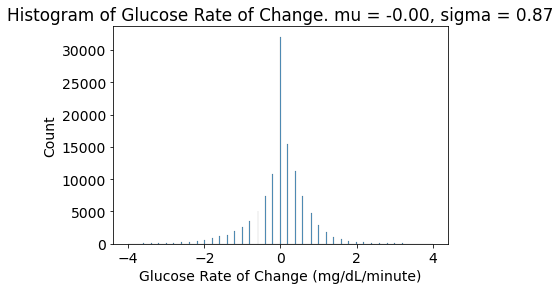

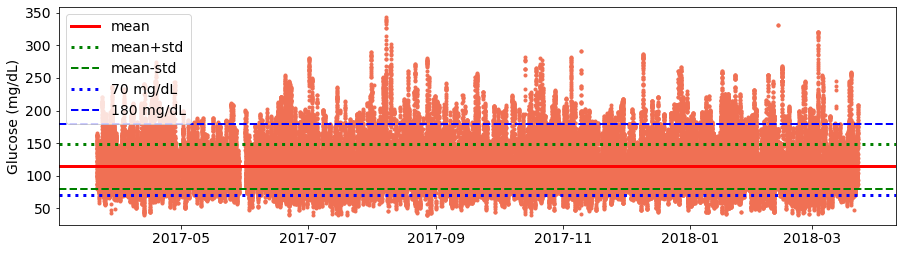

Patient ID:  66937570


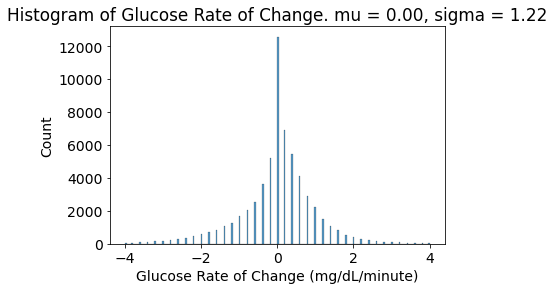

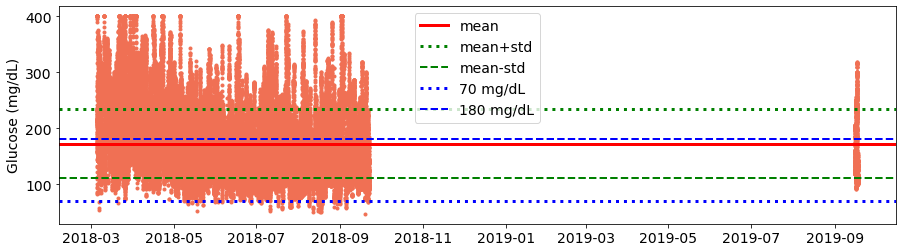

Patient ID:  67167655


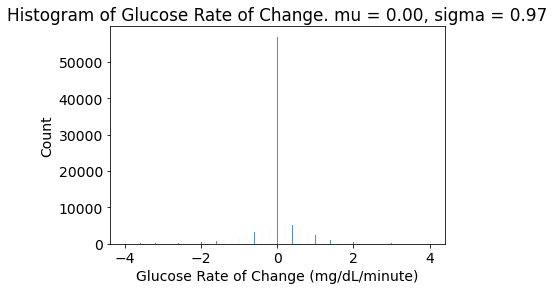

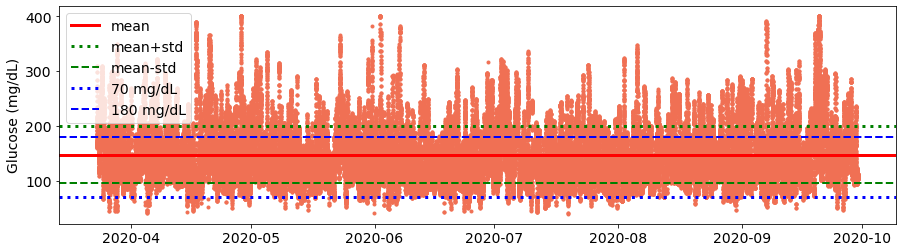

Patient ID:  67208817


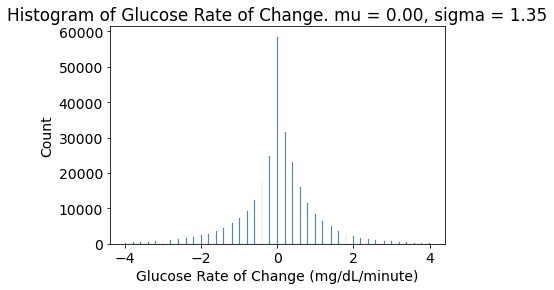

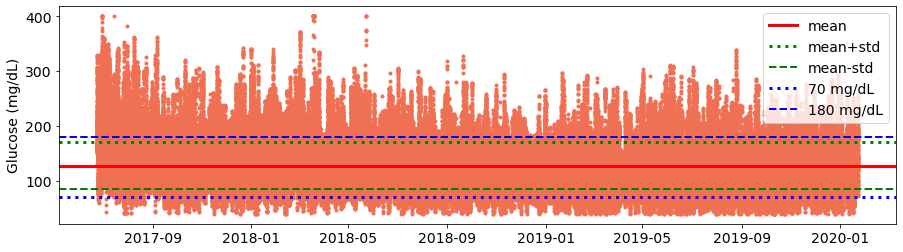

Patient ID:  68026248


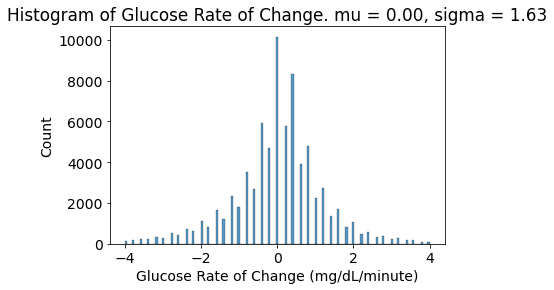

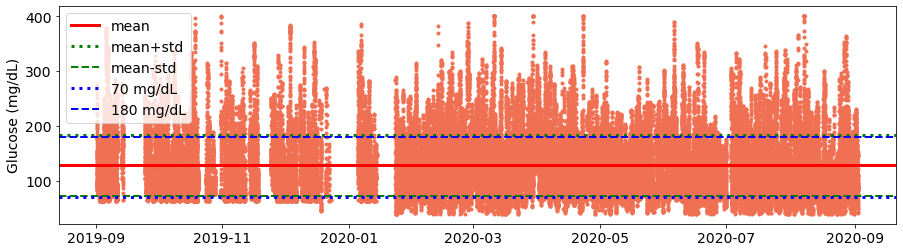

Patient ID:  69965708


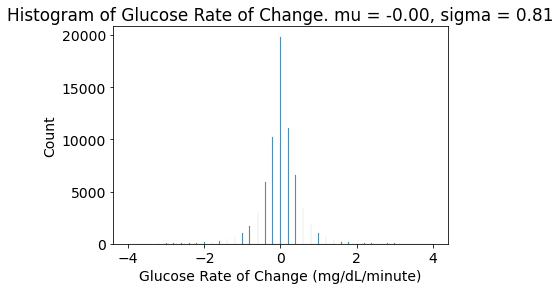

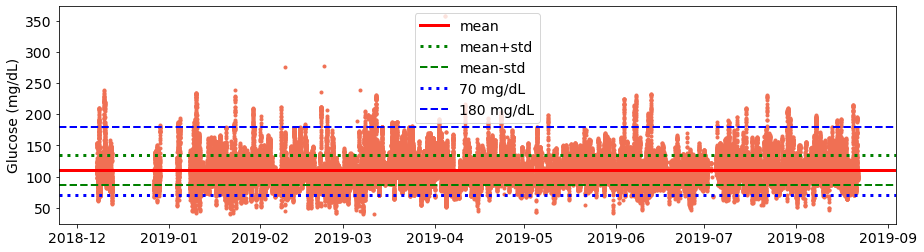

Patient ID:  70454270


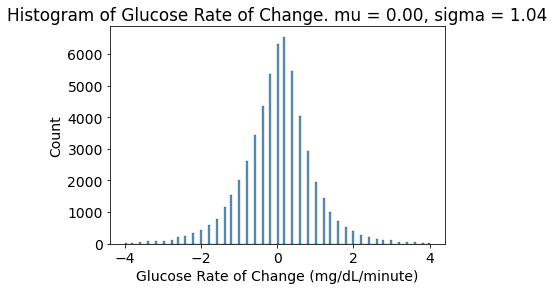

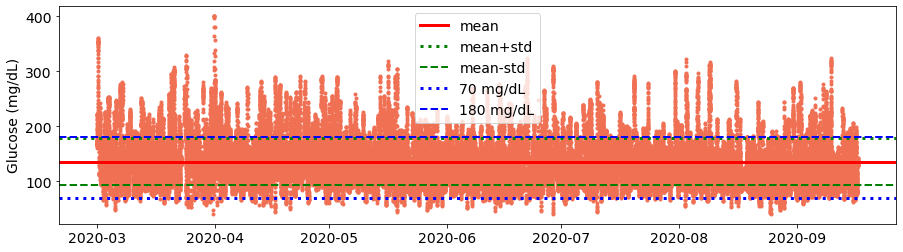

Patient ID:  70811987


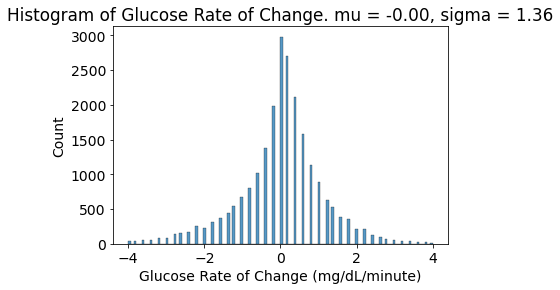

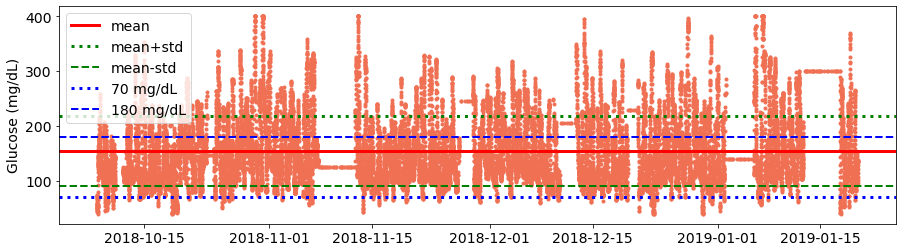

Patient ID:  71618088


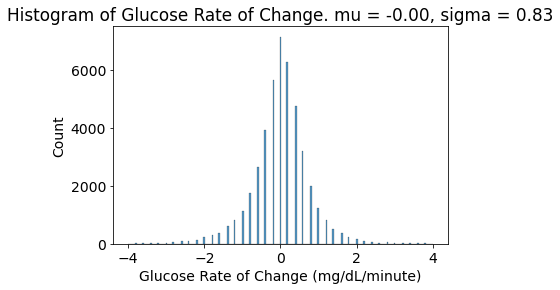

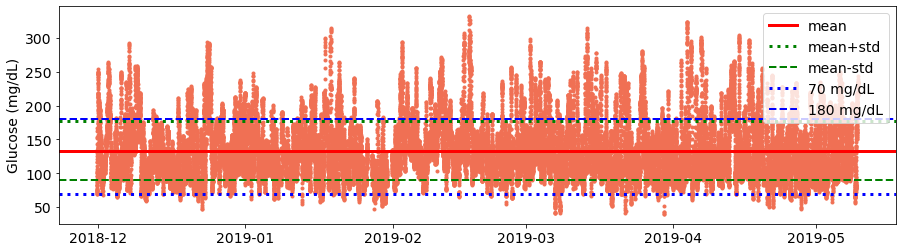

Patient ID:  72492570


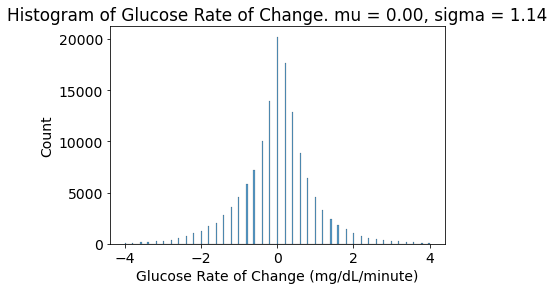

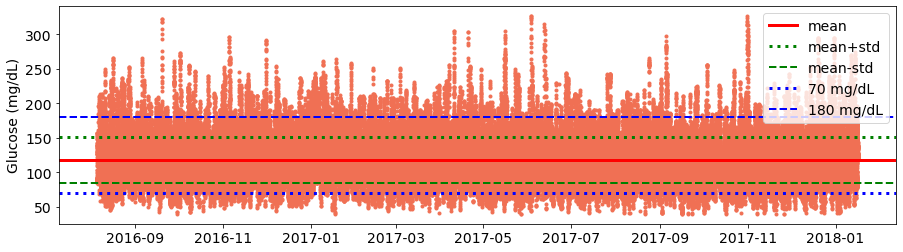

Patient ID:  73398408


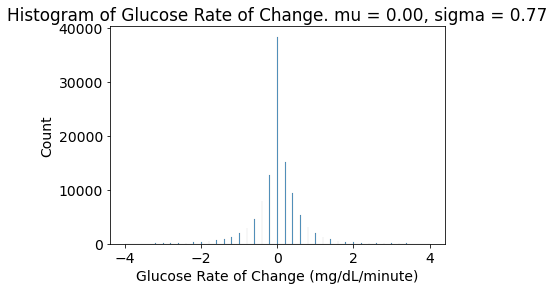

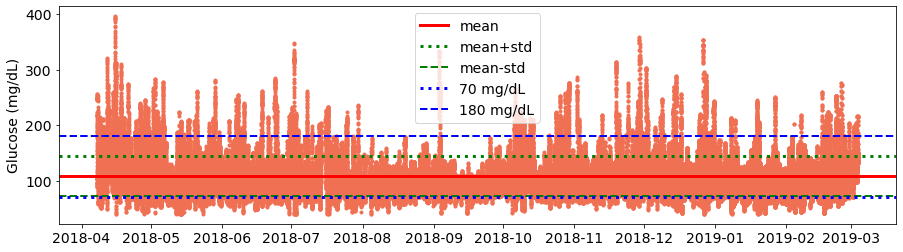

Patient ID:  74077367


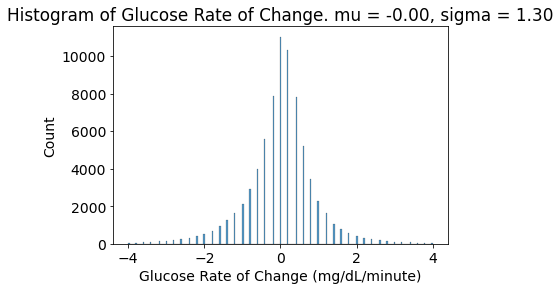

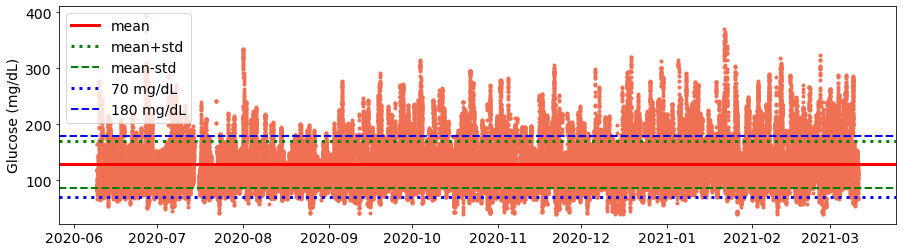

Patient ID:  76817975


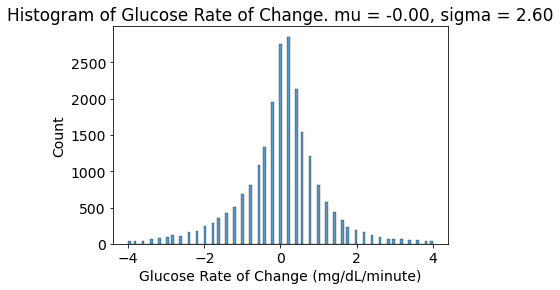

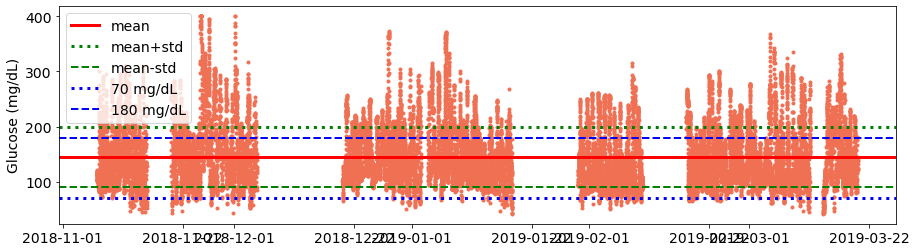

Patient ID:  77104076


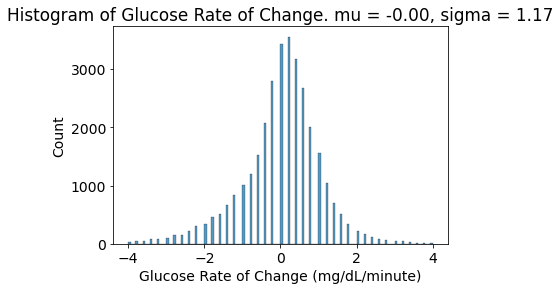

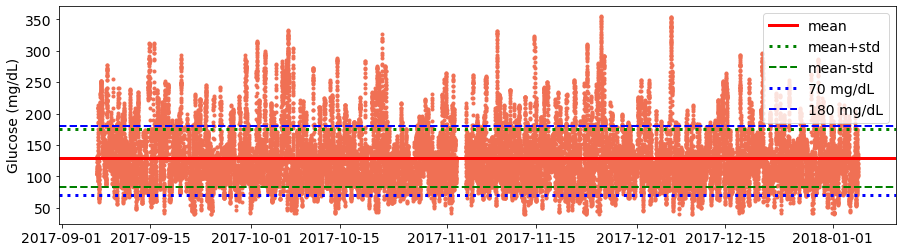

Patient ID:  77411181


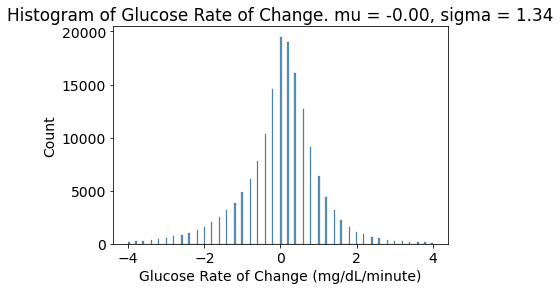

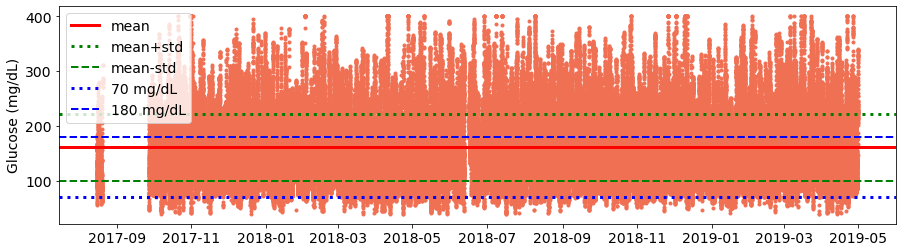

Patient ID:  78420229


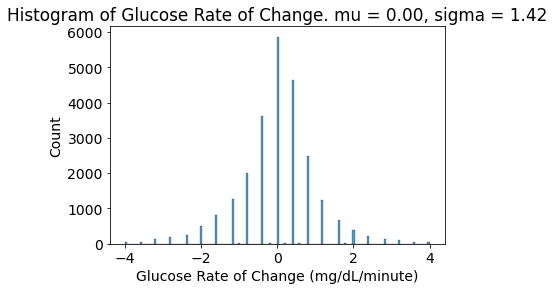

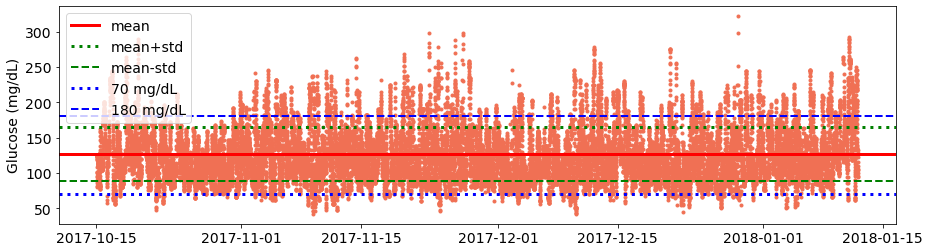

Patient ID:  79526193


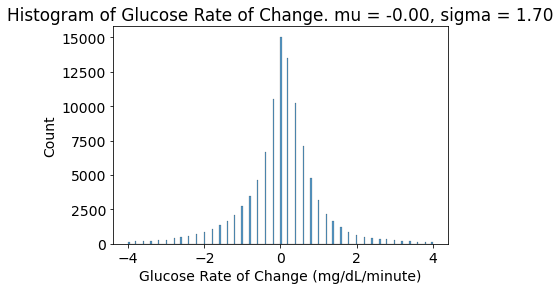

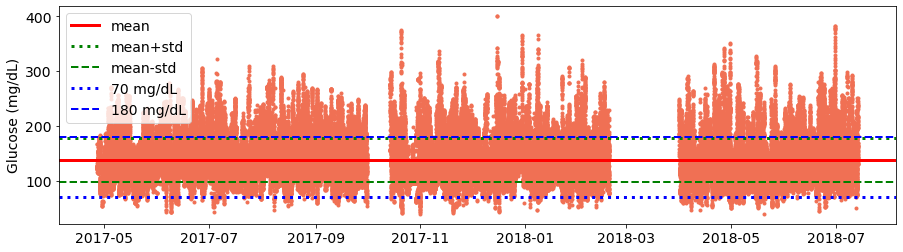

Patient ID:  80501215


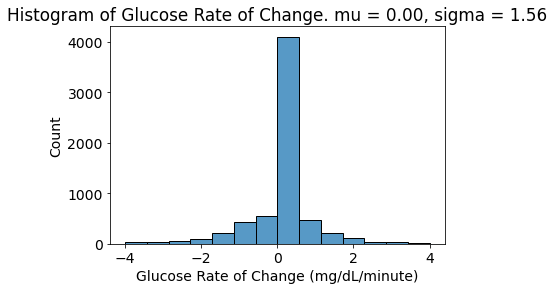

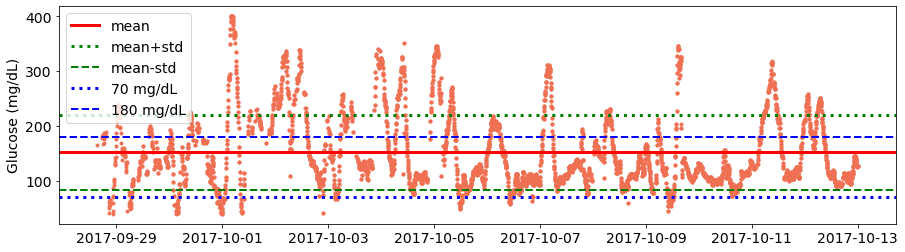

Patient ID:  80625186


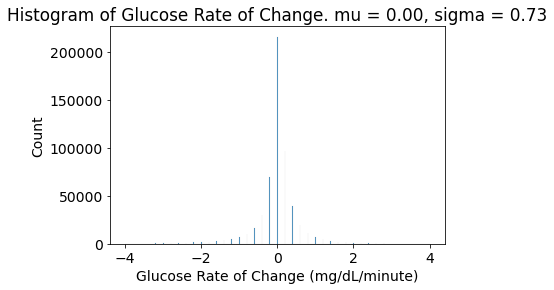

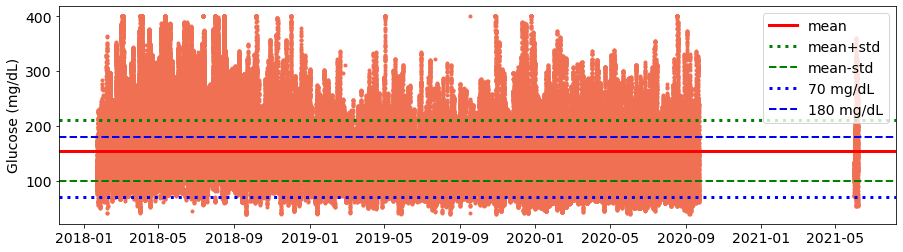

Patient ID:  80796147


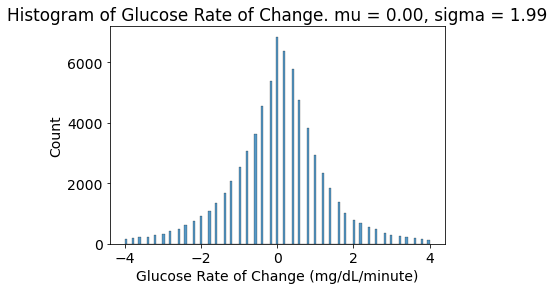

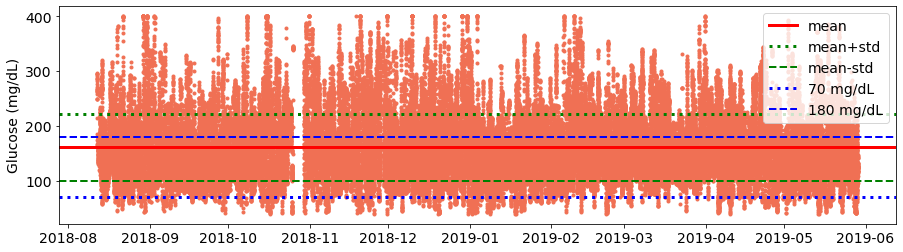

Patient ID:  81680176


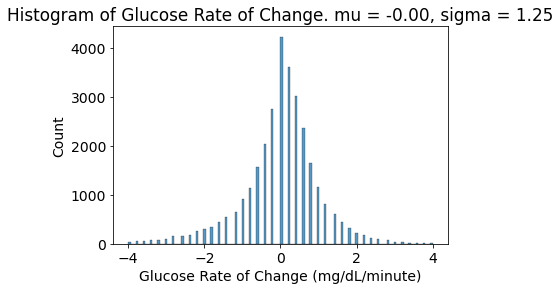

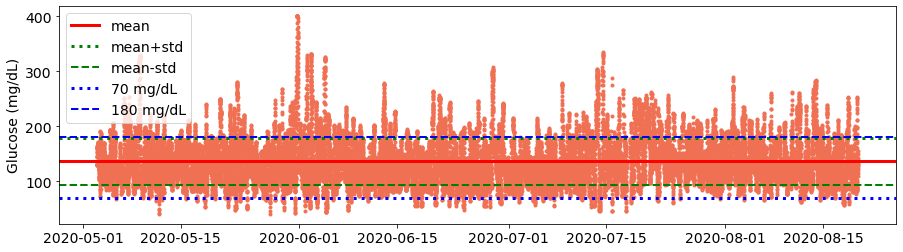

Patient ID:  84109428


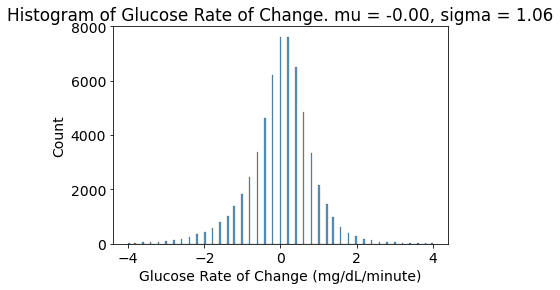

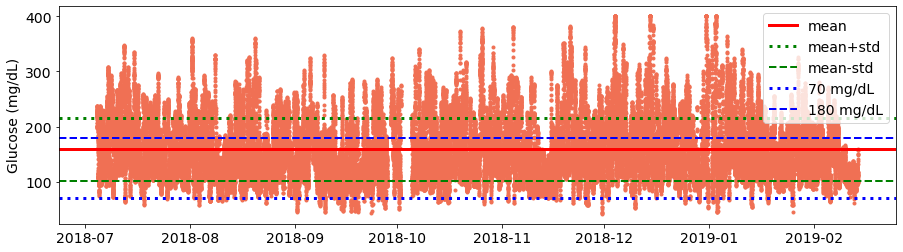

Patient ID:  84589080


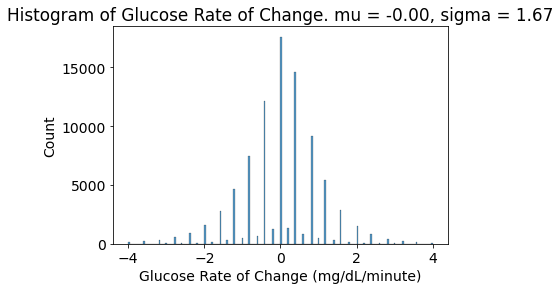

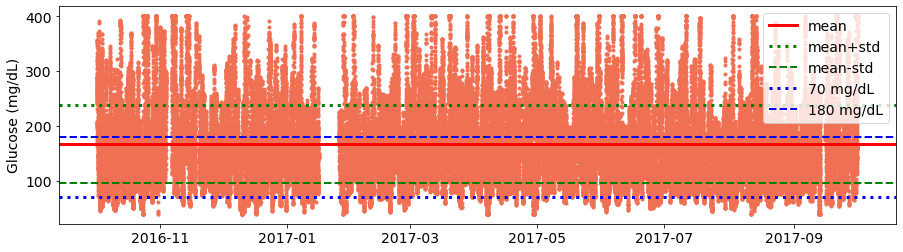

Patient ID:  85199788


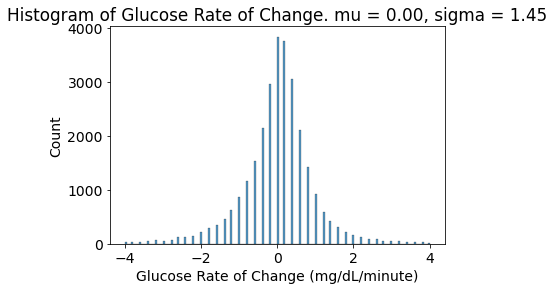

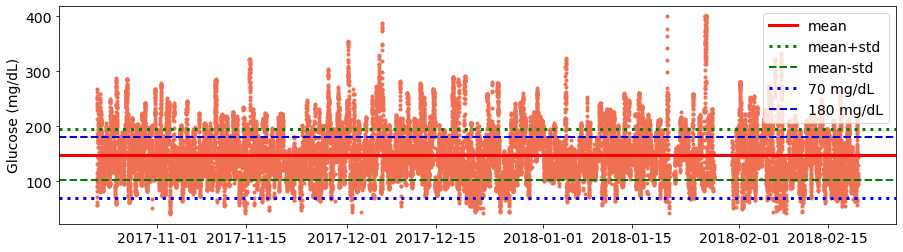

Patient ID:  86286077


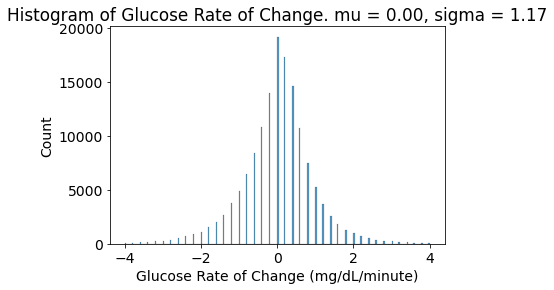

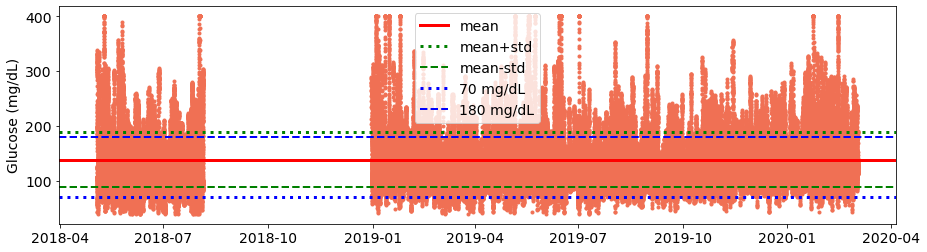

Patient ID:  86323903


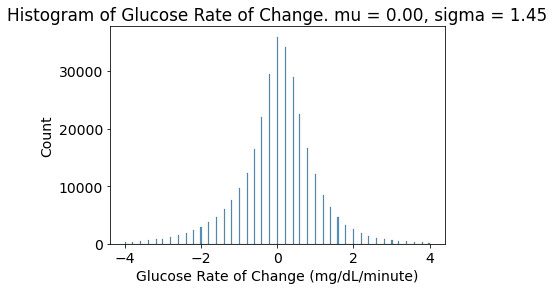

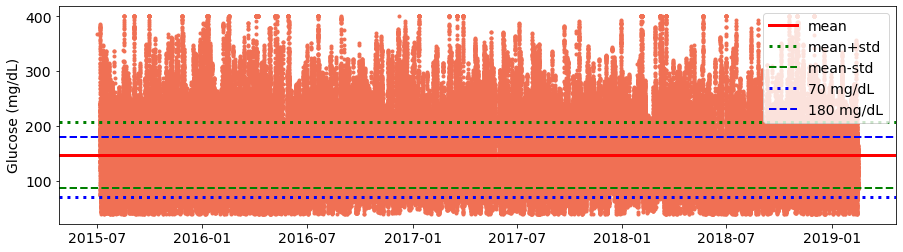

Patient ID:  88004055


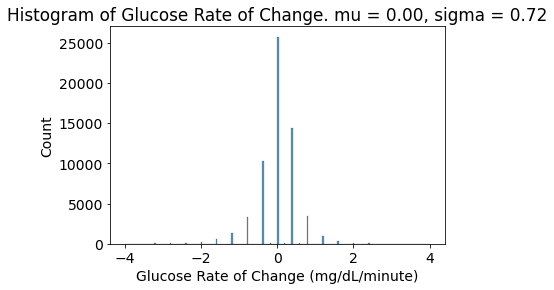

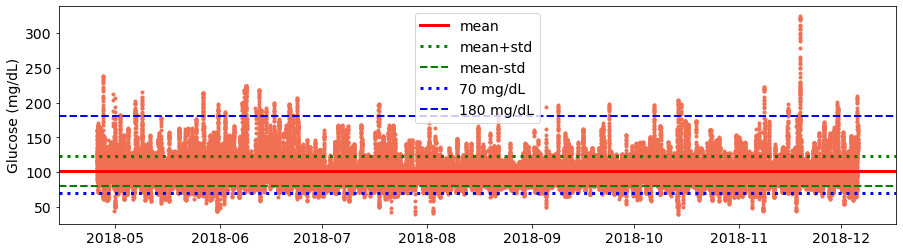

Patient ID:  89032650


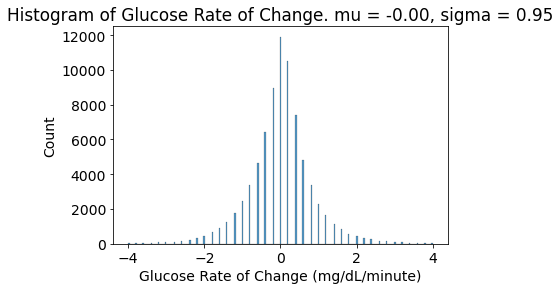

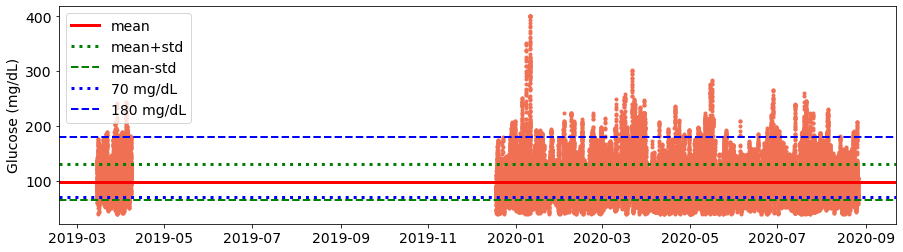

Patient ID:  89710417


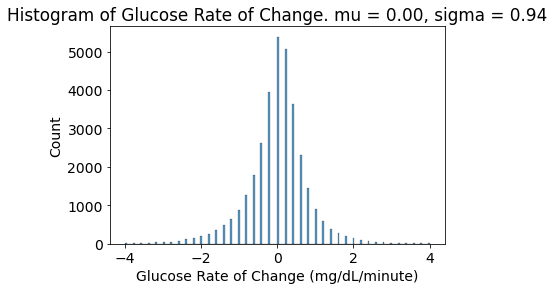

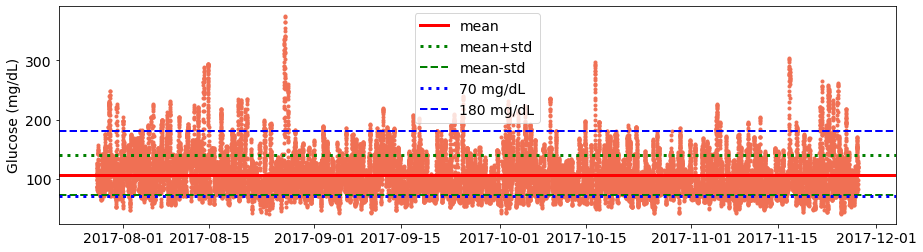

Patient ID:  90398368


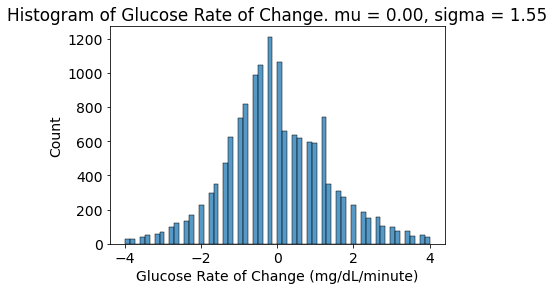

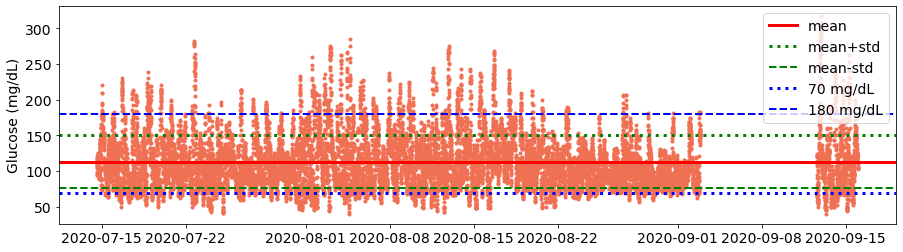

Patient ID:  91161972


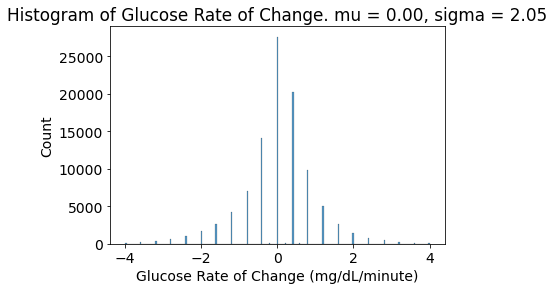

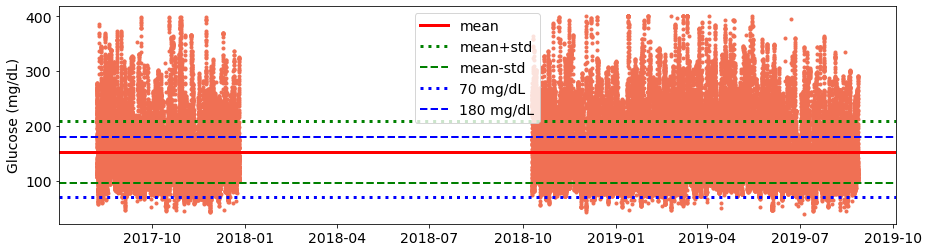

Patient ID:  93839818


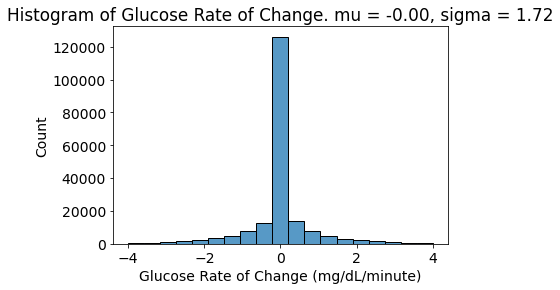

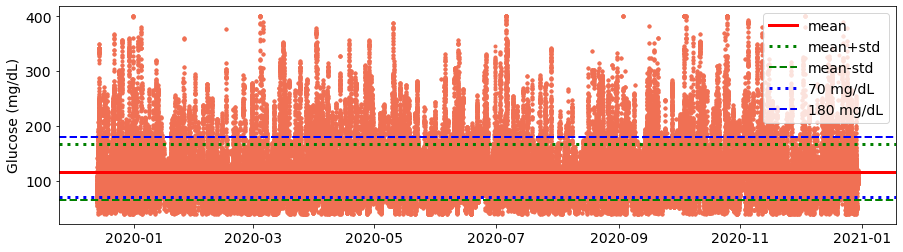

Patient ID:  94200862


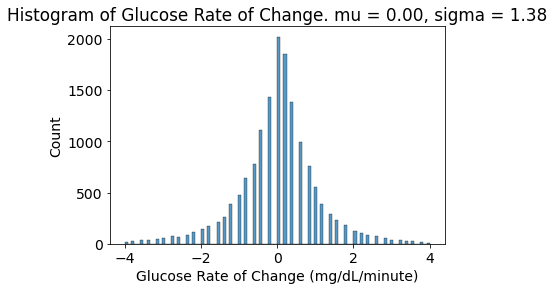

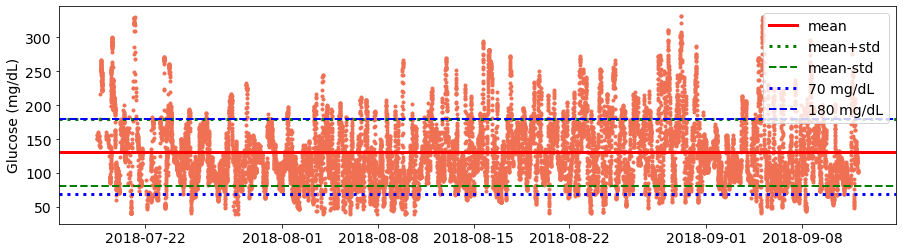

Patient ID:  95614431


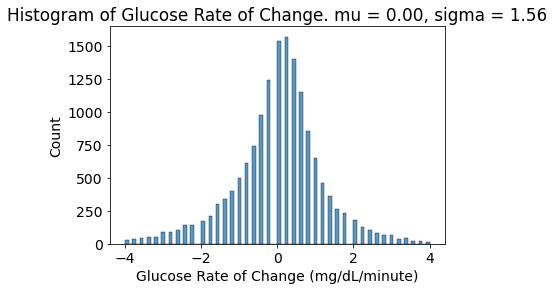

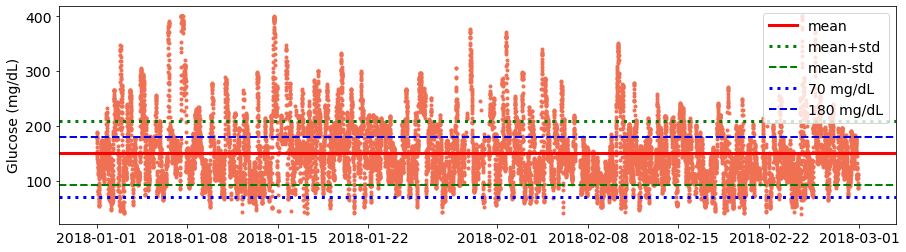

Patient ID:  95851255


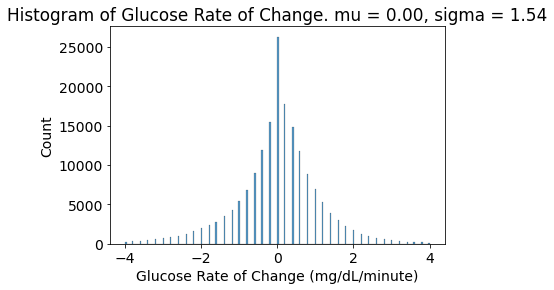

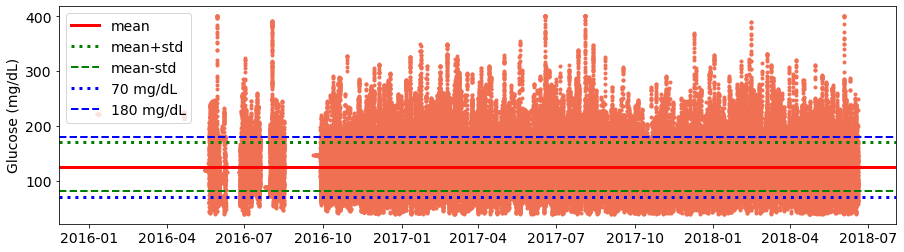

Patient ID:  96254963


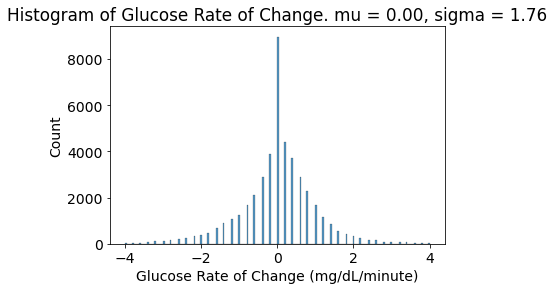

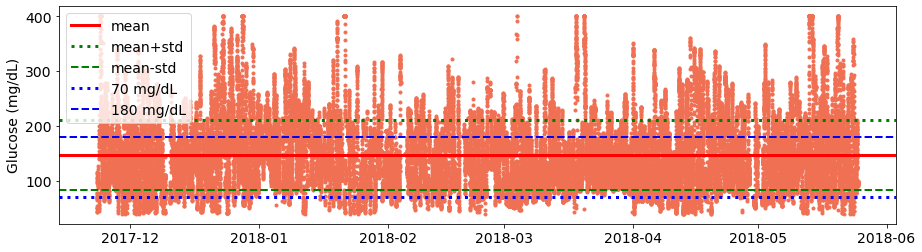

Patient ID:  96805916


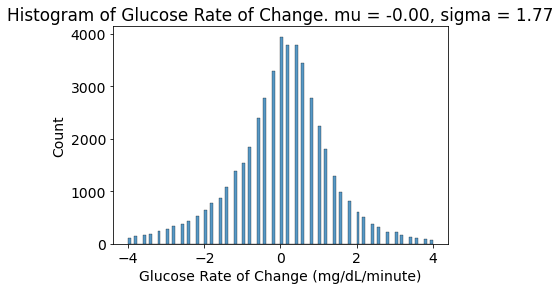

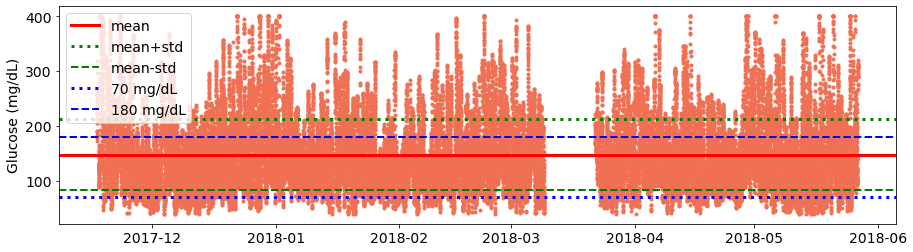

Patient ID:  97417885


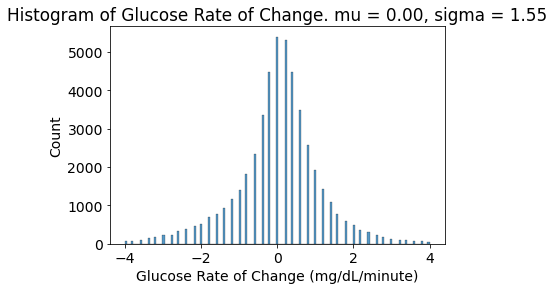

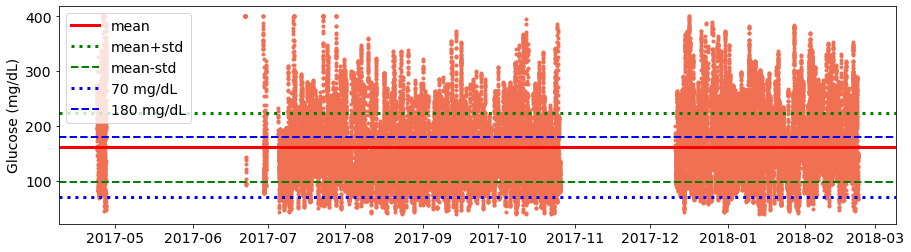

Patient ID:  98340749


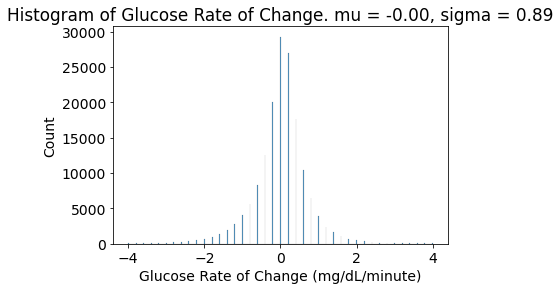

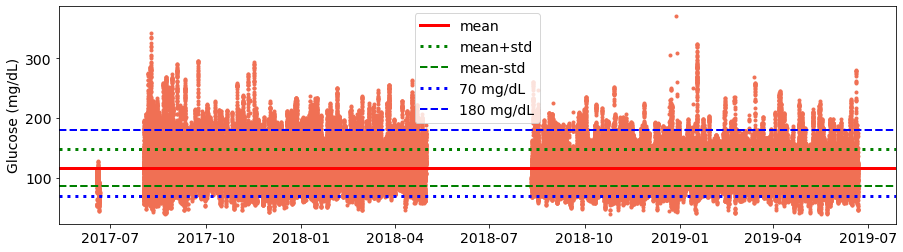

Patient ID:  99712241


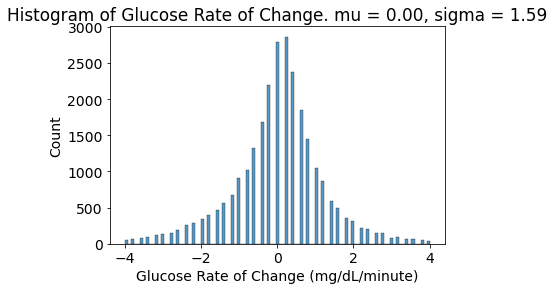

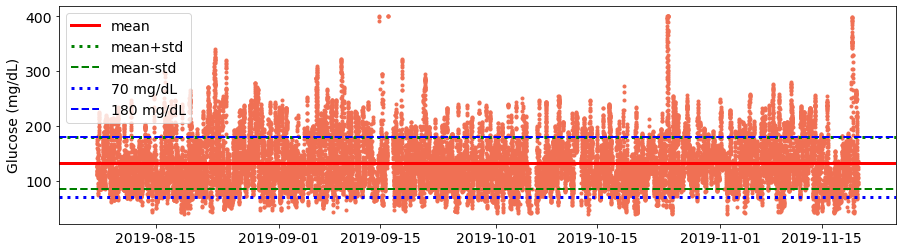

Patient ID:  99848889


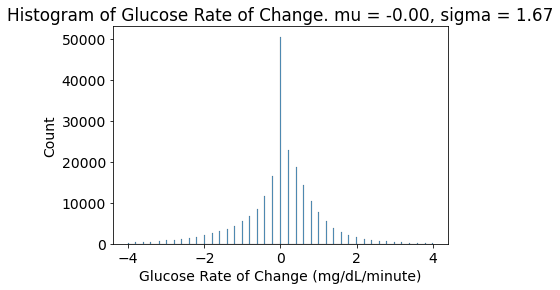

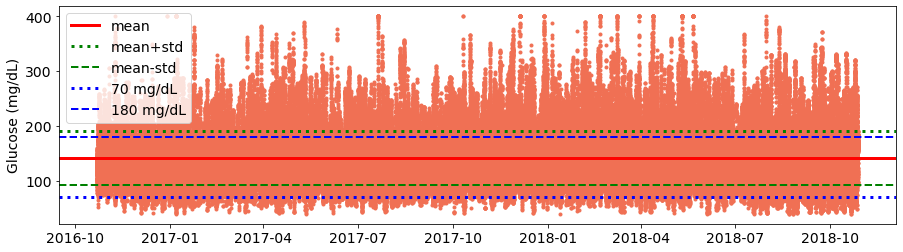

Patient ID:  99908129


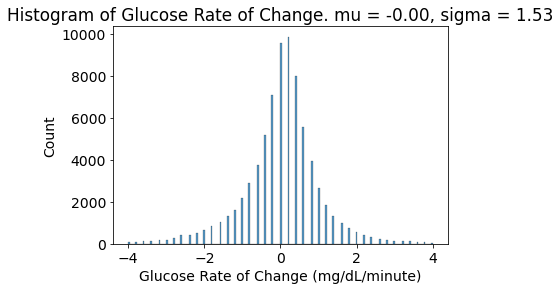

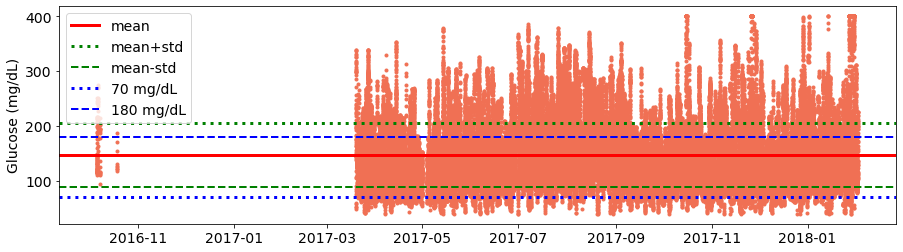

In [4]:
# demographics
all_id, demographics, all_entries_describe = ([] for i in range(3))

# metrics
interdaysd, TORless70, TIR, TORmore180, stdd, POR, J_index, LBGI, HBGI, GMI, stats, bg_roc_stds, bg_roc_means = ([] for i in range(13))
    
i = 0

for f in files:

    patient_demographic = df_demographics[(df_demographics['id'] == int(
        df_id_files.id[i]))]

    if not patient_demographic.empty:

        demographics.append(patient_demographic)

        all_id.append(int(df_id_files.id[i]))

        print("Patient ID: ", int(df_id_files.id[i]))

        p = os.path.join(path, f)
        # saving all entries file paths in var 'all_entries_path'
        all_entries_path.append(p)

        # reading and processing files
        entries = pd.read_csv(p, index_col=None, na_values=" null")
        entries = entries.rename(columns={
            'Timestamp': 'Time',
            'glucose': 'Glucose'
        })

        entries.index = pd.to_datetime(entries["Time"],
                                       format='%Y-%m-%d %H:%M:%S')

        #remove duplicate indexes
        entries = entries[~entries.index.duplicated(keep='first')]

        # Replace infinite updated data with nan
        entries.replace([np.inf, -np.inf], np.nan, inplace=True)
        # Drop rows with NaN
        entries.dropna(inplace=True)

        # remove everything less than 39
        entries = entries[entries['Glucose'].astype(int) > 39]

        # remove everything greater than 40
        entries = entries[entries['Glucose'].astype(int) < 1000]

        # anything greater than 400 replace with 400
        entries['Glucose'].values[entries['Glucose'] > 400] = 400

        # saving statistics of entries files in a list 'male_entries_describe'
        all_entries_describe.append(entries.describe().transpose())

        # calculate TIR and TOR ranges
        ranges = [0, 70, 180, 350]
        entries['ranges'] = pd.cut(entries['Glucose'], bins=ranges)
        
        result = (entries.groupby([pd.Grouper(key="Time"), "ranges"
                                   ])["ranges"].count().unstack(0).T.fillna(0))

        summed_results = result.sum()

        # calculating CGM Metrics
        interdaysd.append(str(cgm.interdaysd(entries)))
        interdaycv.append(str(cgm.interdaycv(entries)))

        TORless70.append(
            float(round(summed_results.iloc[0] / summed_results.sum() * 100,
                        2)))

        TIR.append(
            float(round(summed_results.iloc[1] / summed_results.sum() * 100,
                        2)))

        TORmore180.append(
            float(round(summed_results.iloc[2] / summed_results.sum() * 100,
                        2)))

        POR.append(str(cgm.POR(entries)))
        J_index.append(str(cgm.J_index(entries)))
        LBGI.append(str(cgm.LBGI(entries)))
        HBGI.append(str(cgm.HBGI(entries)))
        GMI.append(str(cgm.GMI(entries)))

        # calculate BG rate of change
        entries['Glucose Rate of Change'] = entries['Glucose'].diff() / 5

        bg_roc_std = entries['Glucose Rate of Change'].std()
        bg_roc_mean = entries['Glucose Rate of Change'].mean()

        bg_roc_stds.append(float(bg_roc_std))
        bg_roc_means.append(float(bg_roc_mean))

        # Plot BG Rate of Change
        sns.histplot(data=entries,
                     x='Glucose Rate of Change',
                     binrange=(-4, 4))

        plt.title(
            f'Histogram of Glucose Rate of Change. mu = {bg_roc_mean:.2f}, sigma = {bg_roc_std:.2f}'
        )

        plt.xlabel('Glucose Rate of Change (mg/dL/minute)')

        plt.show()

        # Plot Entries
        # Calculate the mean and standard deviation of glucose.
        glucose_mean = np.mean(entries['Glucose'])
        up = np.mean(entries['Glucose']) + np.std(entries['Glucose'])
        dw = np.mean(entries['Glucose']) - np.std(entries['Glucose'])

        # Designate a figure size and font size
        plt.figure(figsize=(15, 4))
        plt.rcParams.update({'font.size': 14})

        # Plot
        plt.plot(entries['Glucose'], '.', color='#F07054')

        # Plot horizontal lines
        plt.axhline(y=glucose_mean,
                    color='red',
                    linestyle='-',
                    linewidth=3,
                    label='mean')
        plt.axhline(y=up,
                    color='green',
                    linestyle='dotted',
                    linewidth=3,
                    label='mean+std')
        plt.axhline(y=dw,
                    color='green',
                    linestyle='dashed',
                    linewidth=2,
                    label='mean-std')
        plt.axhline(y=70,
                    color='blue',
                    linestyle='dotted',
                    linewidth=3,
                    label='70 mg/dL')
        plt.axhline(y=180,
                    color='blue',
                    linestyle='dashed',
                    linewidth=2,
                    label='180 mg/dL')
        plt.legend()
        plt.ylabel('Glucose (mg/dL)')

        plt.show()

    i = i + 1

In [5]:
save_path = r'' # Specify path

all_stats1 = pd.DataFrame({
    'id': all_id,
    'interdaysd': interdaysd,
    'interdaycv': interdaycv,
    'bg_roc_stds': bg_roc_stds,
    'TOR<70 [%]': TORless70,
    'TIR [%]': TIR,
    'TOR>180 [%]': TORmore180,
    'POR': POR,
    'J_index': J_index,
    'LGBI': LBGI,
    'HBGI': HBGI,
    'GMI': GMI})  # convert male ids to dataframe

all_stats2 = pd.concat(all_entries_describe)  # convert statistics to dataframe
all_stats2.reset_index(drop=True, inplace=True)

all_stats3 = pd.concat(demographics)  # convert statistics to dataframe
all_stats3.reset_index(drop=True, inplace=True)
all_stats3 = all_stats3.drop(all_stats3.tail(7).index)

all_stats3a = all_stats3.filter(
    ['age', 'dailyInsulinUnits', 'dailyBasalInsulinUnits', 'height', 'weight'],
    axis=1)

summarised_statistics = pd.concat([all_stats1, all_stats2, all_stats3a],
                                  axis=1)

summarised_statistics = summarised_statistics.apply(pd.to_numeric)

summarised_statistics['count'] = summarised_statistics['count'].astype(int)
summarised_statistics['min'] = summarised_statistics['min'].astype(int)
summarised_statistics['25%'] = summarised_statistics['25%'].astype(int)
summarised_statistics['50%'] = summarised_statistics['50%'].astype(int)
summarised_statistics['75%'] = summarised_statistics['75%'].astype(int)
summarised_statistics['max'] = summarised_statistics['max'].astype(int)

all_stats3b = all_stats3.filter(['gender', 'country', 'DIYTech'], axis=1)

complete_statistics = pd.concat([summarised_statistics, all_stats3b], axis=1)

pd.set_option("display.max_columns", None)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = "{:,.2f}".format

complete_statistics.to_csv(
    os.path.join(save_path, "complete_patient_statistics.csv"))

complete_statistics

,id,interdaysd,interdaycv,bg_roc_stds,TOR<70 [%],TIR [%],TOR>180 [%],POR,J_index,LGBI,HBGI,GMI,count,mean,std,min,25%,50%,75%,max,age,dailyInsulinUnits,dailyBasalInsulinUnits,height,weight,gender,country,DIYTech
0,221634,47.57,34.87,1.30,2.46,83.83,13.72,23.37,33.85,0.76,3.54,6.57,43725,136.42,47.57,40,104,127,159,400,46.00,30.00,14.00,186.84,73.00,Male,Germany,AndroidAPS
1,309157,55.32,37.27,0.79,2.37,74.00,23.63,29.81,41.52,0.73,5.41,6.86,122557,148.45,55.32,41,107,138,178,400,14.00,36.31,15.36,146.30,49.00,Female,Australia,AndroidAPS
2,897741,39.70,34.06,1.06,7.76,84.98,7.26,26.20,24.43,1.89,1.76,6.10,184739,116.58,39.70,40,89,110,136,400,41.00,25.49,13.98,167.64,149.00,NaN,USA,"A ""traditional"" OpenAPS rig using the oref0 al..."
3,2033176,47.63,37.06,1.50,7.17,79.14,13.69,28.90,31.03,1.72,3.08,6.38,73716,128.52,47.63,40,94,121,155,400,35.00,NaN,NaN,NaN,NaN,Male,Australia,AndroidAPS
4,2199852,65.90,38.51,1.60,1.16,62.93,35.91,29.13,56.18,0.38,8.85,7.40,51325,171.12,65.90,40,122,158,207,400,42.00,43.58,21.32,182.88,185.00,Male,USA,"A ""traditional"" OpenAPS rig using the oref0 al..."
5,4762925,59.24,36.99,1.77,2.18,66.90,30.93,29.05,48.14,0.59,7.04,7.14,43491,160.16,59.24,40,116,150,194,400,42.00,45.83,30.80,182.88,195.00,Male,USA,"A ""traditional"" OpenAPS rig using the oref0 al..."
6,7886752,36.17,32.05,1.40,9.68,85.87,4.45,28.81,22.21,2.36,1.32,6.01,19384,112.86,36.17,40,88,108,134,337,72.00,38.98,15.95,152.40,156.00,NaN,USA,Loopkit/Loop
7,12689381,43.26,33.48,0.88,1.77,85.54,12.69,24.40,29.74,0.78,2.78,6.40,1127,129.21,43.28,50,100,117,147,306,49.00,70.00,38.00,182.88,200.00,Female,USA,Loopkit/Loop
8,13029224,56.09,40.43,1.41,5.12,74.29,20.59,27.47,37.95,1.32,4.58,6.63,110558,138.73,56.09,40,98,125,170,400,40.00,52.01,17.00,173.74,170.00,NaN,USA,"A ""traditional"" OpenAPS rig using the oref0 al..."
9,13484299,44.21,35.58,0.88,5.39,83.98,10.64,26.74,28.39,1.41,2.52,6.28,132081,124.27,44.21,40,93,115,146,400,30.00,33.50,15.55,161.54,137.00,NaN,USA,"A ""traditional"" OpenAPS rig using the oref0 al..."


# Visualising demographics and calculated metrics

Text(0.5, 15.440000000000012, 'Interday Standard Deviation')

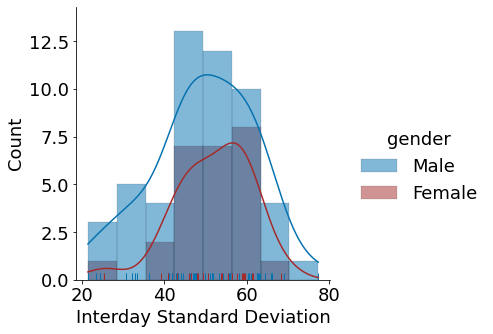

In [16]:
complete_statistics['interdaysd'] = complete_statistics['interdaysd'].astype(
    float)

complete_statistics.loc[complete_statistics['gender'] == 'Transgender Male',
                        'gender'] = 'Male'

complete_statistics['interdaysd']
plt.rcParams.update({'font.size': 18})
sns.displot(complete_statistics,
            x=complete_statistics['interdaysd'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('Interday Standard Deviation')

Text(0.5, 15.440000000000012, 'Interday Coefficient of Variation')

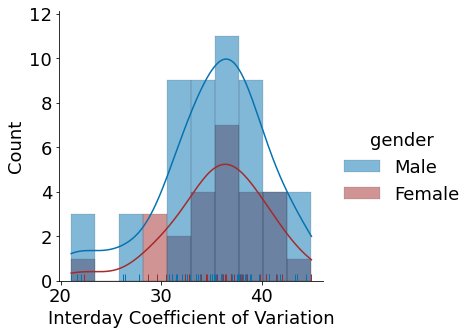

In [17]:
sns.displot(complete_statistics,
            x=complete_statistics['interdaycv'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('Interday Coefficient of Variation')

Text(0.5, 15.440000000000012, 'Standard Deviation for Glucose Rate of Change (mg/dL/minute)')

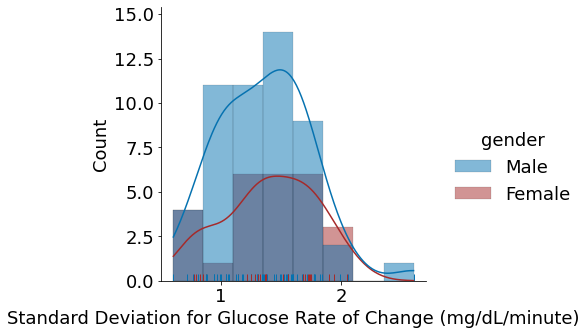

In [18]:
sns.displot(complete_statistics,
            x=complete_statistics['bg_roc_stds'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('Standard Deviation for Glucose Rate of Change (mg/dL/minute)')

Text(0.5, 15.440000000000012, 'Mean Glucose (mg/dL)')

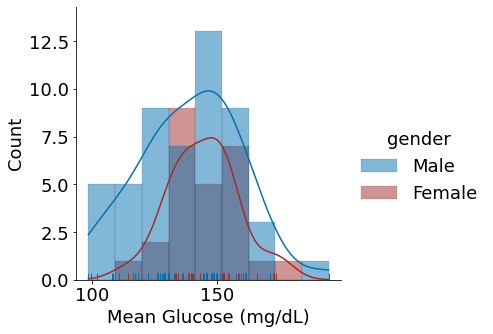

In [19]:
sns.displot(complete_statistics,
            x=complete_statistics['mean'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('Mean Glucose (mg/dL)')

Text(0.5, 15.440000000000012, 'J_Index')

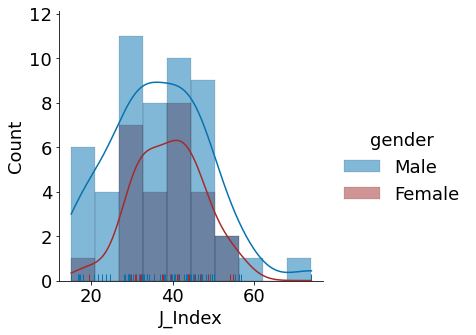

In [20]:
sns.displot(complete_statistics,
            x=complete_statistics['J_index'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('J_Index')

Text(0.5, 15.440000000000012, 'Low Blood Glucose Index (LBGI)')

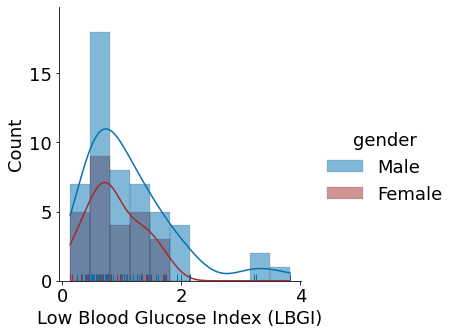

In [21]:
sns.displot(complete_statistics,
            x=complete_statistics['LGBI'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('Low Blood Glucose Index (LBGI)')

Text(0.5, 15.440000000000012, 'High Blood Glucose Index (HBGI)')

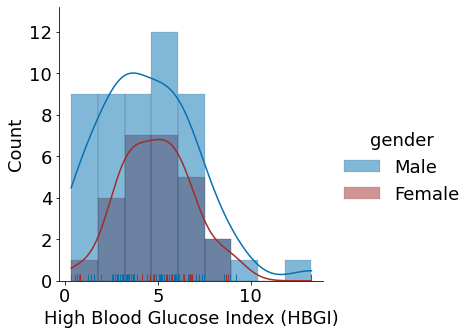

In [22]:
sns.displot(complete_statistics,
            x=complete_statistics['HBGI'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('High Blood Glucose Index (HBGI)')

Text(0.5, 15.440000000000012, 'Glucose Management Indicator (GMI)')

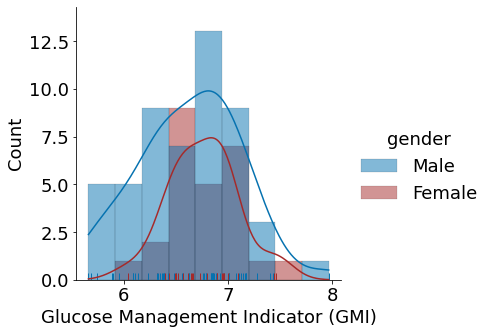

In [23]:
sns.displot(complete_statistics,
            x=complete_statistics['GMI'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('Glucose Management Indicator (GMI)')

Text(0.5, 15.440000000000012, 'Percentage of Time in Range (TIR)')

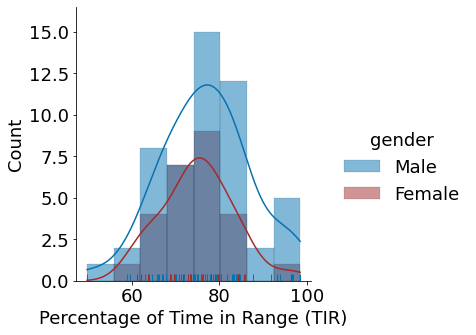

In [24]:
sns.displot(complete_statistics,
            x=complete_statistics['TIR [%]'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('Percentage of Time in Range (TIR)')

Text(0.5, 15.440000000000012, 'Percentage of Time Outside Range (POR)')

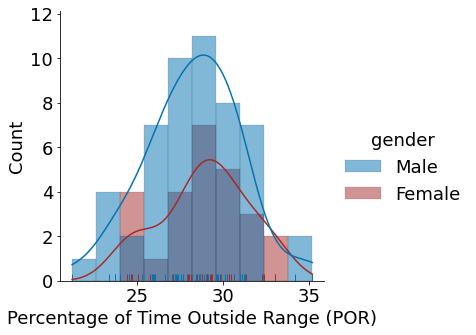

In [25]:
sns.displot(complete_statistics,
            x=complete_statistics['POR'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('Percentage of Time Outside Range (POR)')

Text(0.5, 15.440000000000012, 'Daily Basal Insulin Units')

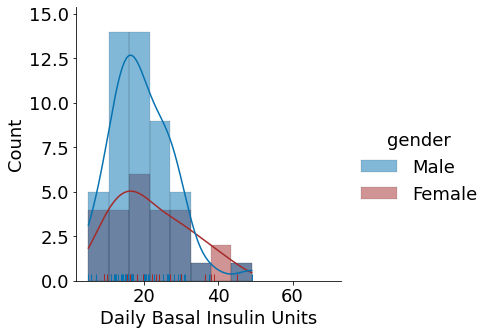

In [26]:
sns.displot(complete_statistics,
            x=complete_statistics['dailyBasalInsulinUnits'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('Daily Basal Insulin Units')

Text(0.5, 15.440000000000012, 'Daily Insulin Units')

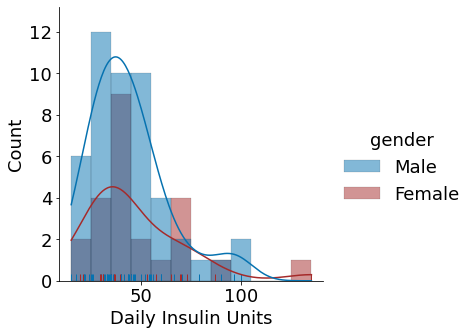

In [27]:
sns.displot(complete_statistics,
            x=complete_statistics['dailyInsulinUnits'],
            hue=complete_statistics['gender'],
            palette=["#0672B0", "brown"],
            alpha=0.5,
            linewidth=0.1,
            kde=True,
            rug=True)
plt.xlabel('Daily Insulin Units')